Обработка изображений

Лабораторная работа №1

Авдеев Роман, 317

2023

In [176]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
%config InlineBackend.figure_formats = ['svg']
%matplotlib inline
import heapq

# Intermediate

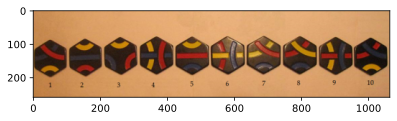

In [177]:
base_image = cv2.imread("Dozen_0.bmp") 
base_image = cv2.cvtColor(base_image, cv2.COLOR_BGR2RGB)

plt.imshow(base_image) 
plt.show() 

In [178]:
print('Размеры изображения:', base_image.shape)

Размеры изображения: (259, 1064, 3)


## Задание 3 (Определить номер фишки)

### Демонстрация работы на всех данных Single_*.bmp (c комментариями)

1. фишка - длинная синяя, длинная красная, короткая желтая
2. фишка - прямая синяя, короткая красная, короткая желтая
3. фишка - короткая синяя, короткая красная, короткая желтая
4. фишка - прямая синяя, длинная красная, длинная желтая
5. фишка - короткая синяя, прямая красная, короткая желтая
6. фишка - длинная синяя, длинная красная, прямая желтая
7. фишка - короткая синяя, длинная красная, длинная желтая
8. фишка - короткая синяя, длинная красная, длинная желтая
9. фишка - длинная синяя, прямая красная, длинная желтая
10. фишка - длинная синяя, длинная красная, короткая желтая

In [179]:
types_dict={
        '1':'длинная синяя; длинная красная; короткая желтая; ',
        '2':'прямая синяя; короткая красная; короткая желтая; ',
        '3':'короткая синяя; короткая красная; короткая желтая; ',
        '4':'прямая синяя; длинная красная; длинная желтая; ',
        '5':'короткая синяя; прямая красная; короткая желтая; ',
        '6':'длинная синяя; длинная красная; прямая желтая; ',
        '7':'короткая синяя; длинная красная; длинная желтая; ',
        '8':'короткая синяя; длинная красная; длинная желтая; ',
        '9':'длинная синяя; прямая красная; длинная желтая; ',
        '10':'длинная синяя; длинная красная; короткая желтая; ',
    }

#### Методы

In [180]:
# подсчет площади и разрывов у цветных линий

def area_count(num_images=4, *args):
    color_squares = np.zeros((4))
    color_gaps = np.zeros((4))
    images_list = list(args)
    i = 0
    
    for image in images_list:
        contours = cv2.findContours(image.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)[0]
        if len(contours) == 1: 
            color_squares[i] = cv2.contourArea(contours[0])
        else:
            sum_area = 0.0
            gaps = 0
            for cnt in contours:
                gaps += 1
                M = cv2.moments(cnt)
                if M['m00'] != 0.0:
                    x1 = int(M['m10']/M['m00'])
                    y1 = int(M['m01']/M['m00'])
                sum_area += cv2.contourArea(cnt)
            color_squares[i] = sum_area
            color_gaps[i] = gaps - 1
        i+=1
        
    return color_squares, color_gaps 

In [181]:
def print_images(n_im=3, gray=False, *args):
    images = args
    f, ax = plt.subplots(nrows=1, ncols=n_im, figsize=(16, 12), constrained_layout=True)
    for i in range(n_im):
        if gray:
            ax[i].imshow(images[i], cmap='gray')
        else:
            ax[i].imshow(images[i])
    plt.show()

In [182]:
def print_images_list(images, gray, nrows, ncols, figsize=(10, 4)):
    f, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, constrained_layout=True)
    
    if nrows > 1:
        for i in range(nrows):
            for j in range(ncols):
                if gray:
                    ax[i, j].imshow(images[i*ncols + j], cmap='gray')
                else:
                    ax[i, j].imshow(images[i*ncols + j])
    else:
        for j in range(ncols):
            if gray:
                ax[j].imshow(images[j], cmap='gray')
            else:
                ax[j].imshow(images[j])
    plt.show()

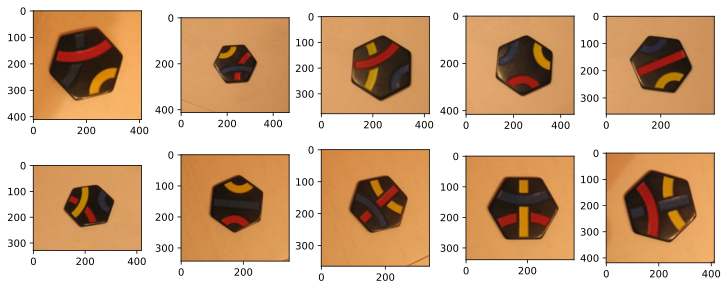

In [183]:
# имена считываемых файлов
image_names = ["Single_0.bmp", "Single_1.bmp", "Single_2.bmp", "Single_3.bmp", "Single_4.bmp",
                "Single_5.bmp", "Single_6.bmp", "Single_7.bmp", "Single_8.bmp", "Single_9.bmp"]

# лист уже считанных исходных тестовых файлов
test_images = []

for image in image_names:
    test_images.append(cv2.imread(image))
for i in range(len(test_images)):
    test_images[i] = cv2.cvtColor(test_images[i], cv2.COLOR_BGR2RGB)

print_images_list(test_images, False, 2, 5)

In [184]:
# копия листа считанных файлов - для выделения цвета
images = test_images.copy()

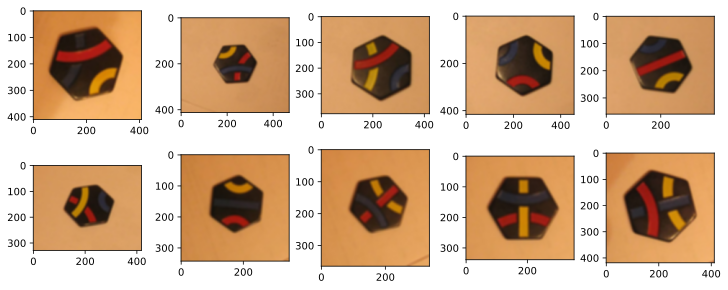

In [185]:
for i in range(len(images)):
    images[i] = cv2.GaussianBlur(images[i], (11, 11), 5)

print_images_list(images, False, 2, 5)

In [186]:
def approx_figures(test_images, image_names):
    if type(test_images) is list:
        # копия листа считанных файлов для аппроксимации контуров
        images_contours = test_images.copy()

        # лист изображений с выделенными контурами для вывода/демонстрации
        approxed = []

        # координаты вершин шестиугольников - обход против часовой стрелки
        coordinates = []

        for i in range(len(images_contours)):
            coordinates.append(np.zeros((len(test_images), 2)))

        # рисуем шестиугольник + сохраняем координаты вершин для вычисления середин ребер
        for i in range(len(images_contours)):
            images_contours[i] = cv2.imread(image_names[i], cv2.IMREAD_GRAYSCALE)
            images_contours[i] = cv2.cvtColor(images_contours[i], cv2.COLOR_BGR2RGB)
            images_contours[i] = cv2.GaussianBlur(images_contours[i], (11, 11), 0)
            images_contours[i] = cv2.threshold(images_contours[i], 135, 255, cv2.THRESH_BINARY)[1]
            images_contours[i] = cv2.bitwise_not(images_contours[i])

            edges = cv2.Canny(images_contours[i], 100, 200)
            contours = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]

            largest_cont = max(contours, key=cv2.contourArea) 
            epsilon = 0.03 * cv2.arcLength(largest_cont, True)
            approx = cv2.approxPolyDP(largest_cont, epsilon, True)

            # рисуем  шестиугольник
            cv2.drawContours(images_contours[i], [approx], -1, (0, 255, 0), 3)

            # отображение изображения
            approxed.append(images_contours[i])

            # сохраняем координаты
            if len(approx.squeeze()) == 6:
                coordinates[i] = np.array(approx.squeeze())
            
        print_images_list(approxed, False, 2, 5)
    else:
        images_contours = test_images.copy()
        approxed = []
        coordinates = []

        coordinates.append(np.zeros((len(test_images), 2)))

        images_contours = cv2.imread(image_names, cv2.IMREAD_GRAYSCALE)
        images_contours= cv2.cvtColor(images_contours, cv2.COLOR_BGR2RGB)
        images_contours = cv2.GaussianBlur(images_contours, (11, 11), 0)
        images_contours = cv2.threshold(images_contours, 135, 255, cv2.THRESH_BINARY)[1]
        images_contours = cv2.bitwise_not(images_contours)

        edges = cv2.Canny(images_contours, 100, 200)
        contours = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]

        largest_cont = max(contours, key=cv2.contourArea) 
        epsilon = 0.03 * cv2.arcLength(largest_cont, True)
        approx = cv2.approxPolyDP(largest_cont, epsilon, True)

        cv2.drawContours(images_contours, [approx], -1, (0, 255, 0), 3)
        approxed.append(images_contours)

        if len(approx.squeeze()) == 6:
            coordinates[0] = np.array(approx.squeeze())
            
        plt.imshow(approxed[0], cmap='gray')
        plt.show()
        
    return coordinates

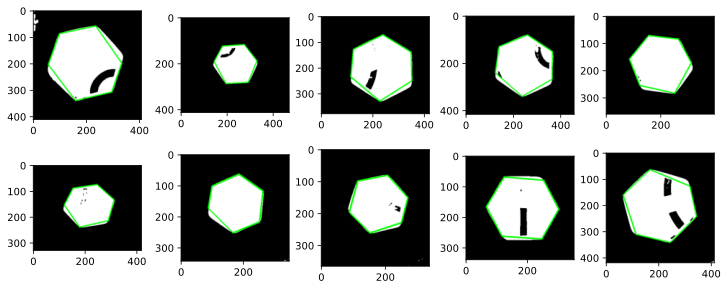

In [187]:
coordinates = approx_figures(test_images, image_names)

In [188]:
# находим координаты середин ребер

def edge_middle(coordinates):
    coord_middle = []

    if len(coordinates) > 1:
        # для каждого изображения
        for i in range(len(coordinates)):
            current_coord = np.zeros((6,2))
            for j in range(5):
                current_coord[j] = (coordinates[i][j] + coordinates[i][j+1])/2
            current_coord[5] = (coordinates[i][0] + coordinates[i][5])/2
            
            # добавляем массив координат середин текущего шестиугольника
            coord_middle.append(current_coord)
    else:
        current_coord = np.zeros((6,2))
        for j in range(5):
            current_coord[j] = (coordinates[0][j] + coordinates[0][j+1])/2
        current_coord[5] = (coordinates[0][0] + coordinates[0][5])/2
            
        coord_middle.append(current_coord)
    return coord_middle

In [189]:
coord_middle = edge_middle(coordinates)

$$Примерная \space длина \space ребра: mean(a_i) = mean_{i \neq j}(\sqrt((x_i - x_j)^2 + (y_i - y_j)^2))$$
$$Где \space a_i - длина \space i^{го} \space ребра \space данного \space шестиугольника$$

In [190]:
# находим среднюю длину ребра для конкретного шестиугольника

def mean_edge_length(current_coordinates):
    lengths = np.zeros(6)
    for i in range(5):
        lengths[i] = np.linalg.norm(current_coordinates[i]-current_coordinates[i+1])
    lengths[5] = np.linalg.norm(current_coordinates[0]-current_coordinates[5])
    return round(np.mean(lengths))

In [191]:
# определение четырех углов квадрата - области вокруг центра ребра, где ищем пиксели нужного цвета
# возвращаем координаты углов, начиная с левого нижнего, по часовой стрелке

def select_pixel_area(pixel_coord, edge_length):
    return np.array([[pixel_coord[0] - edge_length, pixel_coord[1] - edge_length], [pixel_coord[0] - edge_length, pixel_coord[1] + edge_length],
                     [pixel_coord[0] + edge_length, pixel_coord[1] + edge_length], [pixel_coord[0] + edge_length, pixel_coord[1] - edge_length]])

In [192]:
def area_count(num_images, images_list):
    color_squares = np.zeros((num_images))
    color_gaps = np.zeros((num_images))
    i = 0
    
    for image in images_list:
        contours = cv2.findContours(image.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)[0]
        if len(contours) == 1: 
            color_squares[i] = cv2.contourArea(contours[0])
        else:
            sum_area = 0.0
            gaps = 0
            for cnt in contours:
                gaps += 1
                M = cv2.moments(cnt)
                if M['m00'] != 0.0:
                    x1 = int(M['m10']/M['m00'])
                    y1 = int(M['m01']/M['m00'])
                sum_area += cv2.contourArea(cnt)
            color_squares[i] = sum_area
            color_gaps[i] = gaps - 1
        i+=1
        
    return color_squares, color_gaps

In [193]:
# заведем матрицу [10, 3]
# каждой строке соответствует одно из десяти изображений
# столбцам соответствует площадь синего, красного, желтого цветов

color_squares = np.zeros((10, 3))

#### blue detection

In [194]:
blue_images = images.copy()

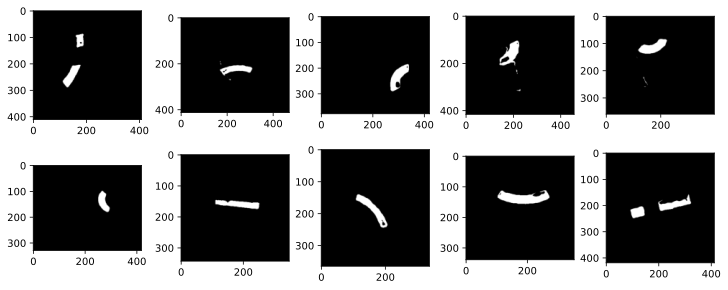

In [195]:
lower_blue = np.array([0, 0, 31], dtype=np.uint8)
upper_blue = np.array([60, 255, 255], dtype=np.uint8)

for i in range(len(images)):
    blue_images[i] = cv2.inRange(blue_images[i], lower_blue, upper_blue)

print_images_list(blue_images, True, 2, 5)

In [196]:
color_squares[:, 0] = area_count(10, blue_images)[0]

In [197]:
coord_middle[0]

array([[166. ,  72.5],
       [ 77. , 145.5],
       [107. , 271.5],
       [226. , 323. ],
       [313. , 252.5],
       [283. , 128. ]])

In [198]:
# определяем грани, с которыми линия текущего цвета имеет пересечения

def detect_colors(blue_images, coord_middle, coordinates):
            
    # заведем лист из 10 элементов - под каждое изображение
    # каждый элемент листа - numpy массив из 6 элементов 
    # 6 элементов = 6 ребер, каждый элемент отвечает за наличие цвета на данном ребре

    color_detection = []
    if len(blue_images) > 1:
        for i in range(len(blue_images)):
            color_detection.append(np.zeros(6))
            
        for i in range(len(blue_images)):
            edge = mean_edge_length(coordinates[i])
            for j in range(6):
                point1 = select_pixel_area(coord_middle[i][j], edge/3)[0]
                point2 = select_pixel_area(coord_middle[i][j], edge/3)[2]
                cropped = blue_images[i][round(point1[1]):round(point2[1]), round(point1[0]):round(point2[0])]
                if cv2.countNonZero(cropped) >= 150:
                    color_detection[i][j] = 1 # нашли фрагмент линии
    else:
        color_detection.append(np.zeros(6))
        edge = mean_edge_length(coordinates[0])
        for j in range(6):
            point1 = select_pixel_area(coord_middle[0][j], edge/3)[0]
            point2 = select_pixel_area(coord_middle[0][j], edge/3)[2]
            cropped = blue_images[0][round(point1[1]):round(point2[1]), round(point1[0]):round(point2[0])]
            if cv2.countNonZero(cropped) >= 150:
                color_detection[0][j] = 1 # нашли фрагмент линии
        
    return color_detection

In [199]:
color_detection = detect_colors(blue_images, coord_middle, coordinates)

In [200]:
color_detection

[array([1., 0., 1., 0., 0., 0.]),
 array([0., 0., 1., 0., 1., 0.]),
 array([0., 0., 0., 1., 1., 0.]),
 array([1., 1., 0., 0., 0., 0.]),
 array([1., 0., 0., 0., 0., 1.]),
 array([0., 0., 0., 0., 1., 1.]),
 array([0., 1., 0., 0., 1., 0.]),
 array([0., 1., 0., 1., 0., 0.]),
 array([1., 0., 0., 0., 1., 0.]),
 array([0., 1., 0., 0., 1., 0.])]

In [201]:
# для каждого изображения массив из 3 элементов (синий - красный - желтый)
# 1 - короткая, 2 - длинная, 3 - прямая
image_detection = []

for i in range(len(color_detection)):
    image_detection.append(np.zeros(3))
        
for i in range(len(color_detection)):
    nonzero_ind = np.nonzero(color_detection[i])[0]
    l = abs(nonzero_ind[0] - nonzero_ind[1])
    if l > 3:
        l = 6 - l
    image_detection[i][0] = l

In [202]:
image_detection

[array([2., 0., 0.]),
 array([2., 0., 0.]),
 array([1., 0., 0.]),
 array([1., 0., 0.]),
 array([1., 0., 0.]),
 array([1., 0., 0.]),
 array([3., 0., 0.]),
 array([2., 0., 0.]),
 array([2., 0., 0.]),
 array([3., 0., 0.])]

#### red detection

In [203]:
red_images = images.copy()

In [204]:
red = np.uint8([[[255, 0, 0]]])
hsv_red = cv2.cvtColor(red, cv2.COLOR_BGR2HSV)
print(hsv_red)

[[[120 255 255]]]


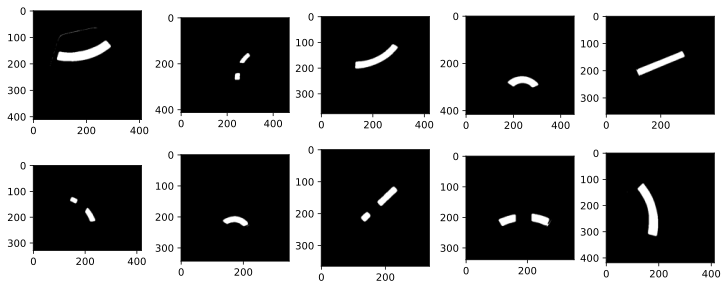

In [205]:
lower_red = np.array([130, 0, 10], dtype=np.uint8)
upper_red = np.array([200, 70, 80], dtype=np.uint8)

for i in range(len(images)):
    red_images[i] = cv2.inRange(red_images[i], lower_red, upper_red)

print_images_list(red_images, True, 2, 5)

In [206]:
color_squares[:, 1] = area_count(10, red_images)[0]

In [207]:
color_detection = detect_colors(red_images, coord_middle, coordinates)

In [208]:
color_detection

[array([0., 1., 0., 0., 0., 1.]),
 array([0., 0., 0., 1., 0., 1.]),
 array([0., 1., 0., 0., 0., 1.]),
 array([0., 0., 1., 1., 0., 0.]),
 array([0., 1., 0., 0., 1., 0.]),
 array([0., 1., 0., 1., 0., 0.]),
 array([0., 0., 1., 1., 0., 0.]),
 array([0., 0., 1., 0., 0., 1.]),
 array([0., 1., 0., 1., 0., 0.]),
 array([1., 0., 1., 0., 0., 0.])]

In [209]:
for i in range(len(color_detection)):
    nonzero_ind = np.nonzero(color_detection[i])[0]
    l = abs(nonzero_ind[0] - nonzero_ind[1])
    if l > 3:
        l = 6 - l
    image_detection[i][1] = l

In [210]:
image_detection

[array([2., 2., 0.]),
 array([2., 2., 0.]),
 array([1., 2., 0.]),
 array([1., 1., 0.]),
 array([1., 3., 0.]),
 array([1., 2., 0.]),
 array([3., 1., 0.]),
 array([2., 3., 0.]),
 array([2., 2., 0.]),
 array([3., 2., 0.])]

#### yellow detection

In [211]:
yellow_images = images.copy()

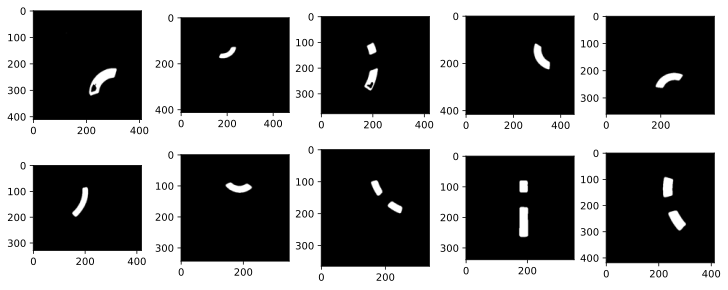

In [212]:
yellow_images = images.copy()

lower_yellow = np.array([140, 80, 0], dtype=np.uint8)
upper_yellow = np.array([255, 150, 25], dtype=np.uint8)

for i in range(len(images)):
    yellow_images[i] = cv2.inRange(yellow_images[i], lower_yellow, upper_yellow)

print_images_list(yellow_images, True, 2, 5)

In [213]:
color_squares[:, 2] = area_count(10, yellow_images)[0]

In [214]:
color_detection = detect_colors(yellow_images, coord_middle, coordinates)

In [215]:
color_detection

[array([0., 0., 0., 1., 1., 0.]),
 array([1., 1., 0., 0., 0., 0.]),
 array([1., 0., 1., 0., 0., 0.]),
 array([0., 0., 0., 0., 1., 1.]),
 array([0., 0., 1., 1., 0., 0.]),
 array([1., 0., 1., 0., 0., 0.]),
 array([1., 0., 0., 0., 0., 1.]),
 array([1., 0., 0., 0., 1., 0.]),
 array([0., 0., 1., 0., 0., 1.]),
 array([0., 0., 0., 1., 0., 1.])]

In [216]:
for i in range(len(color_detection)):
    nonzero_ind = np.nonzero(color_detection[i])[0]
    l = abs(nonzero_ind[0] - nonzero_ind[1])
    if l > 3:
        l = 6 - l
    image_detection[i][2] = l

#### Итог распознавания

In [217]:
print("Итог: синий-красный-желтый")
# 1 - короткая, 2 - длинная, 3 - прямая
image_detection

Итог: синий-красный-желтый


[array([2., 2., 1.]),
 array([2., 2., 1.]),
 array([1., 2., 2.]),
 array([1., 1., 1.]),
 array([1., 3., 1.]),
 array([1., 2., 2.]),
 array([3., 1., 1.]),
 array([2., 3., 2.]),
 array([2., 2., 3.]),
 array([3., 2., 2.])]

In [218]:
colors = ['синяя', 'красная', 'желтая']
answers = []


for i in range(len(image_detection)):
    answer = ''
    for j in range(3):
        if image_detection[i][j] == 1:
            answer += 'короткая '
        elif image_detection[i][j] == 2:
            answer += 'длинная '
        elif image_detection[i][j] == 3:
            answer += 'прямая '
        answer += colors[j]
        answer += '; '
    answers.append(answer)

In [219]:
def print_image_anwers(images, gray, nrows, ncols):
    f, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 30),  tight_layout=True)
    
    for i in range(nrows):
        for j in range(ncols):
            if (i*ncols + j) < len(images):
                if gray:
                    ax[i, j].imshow(images[i*ncols + j], cmap='gray')
                else:
                    ax[i, j].imshow(images[i*ncols + j])
                ax[i, j].set_xlabel(answers[i*ncols + j])
            else:
                break
    plt.show()

In [220]:
print_image_anwers(test_images, False, 5, 2)

#### Определение номера фишки

1. фишка - длинная синяя, длинная красная, короткая желтая
2. фишка - прямая синяя, короткая красная, короткая желтая
3. фишка - короткая синяя, короткая красная, короткая желтая
4. фишка - прямая синяя, длинная красная, длинная желтая
5. фишка - короткая синяя, прямая красная, короткая желтая
6. фишка - длинная синяя, длинная красная, прямая желтая
7. фишка - короткая синяя, длинная красная, длинная желтая
8. фишка - короткая синяя, длинная красная, длинная желтая
9. фишка - длинная синяя, прямая красная, длинная желтая
10. фишка - длинная синяя, длинная красная, короткая желтая

In [221]:
print('Площади цветов на фишке(синий - красный - желтый)')
color_squares

Площади цветов на фишке(синий - красный - желтый)


array([[3531.5, 6579. , 4936.5],
       [3289.5, 1380.5, 1547.5],
       [3379.5, 4359. , 3732.5],
       [5223. , 3425. , 3489. ],
       [2970. , 4061.5, 2547.5],
       [1948. , 1396. , 2517.5],
       [2253.5, 1363.5, 1603. ],
       [2712.5, 1819.5, 1837.5],
       [4248. , 2630.5, 3544.5],
       [4450. , 6363.5, 5104. ]])

In [222]:
def square_comparing(types, image_idx, color_squares):
    if '1'in types and '10' in types:
        if color_squares[image_idx][0] > color_squares[image_idx][1]:
            return '10'
        else:
            return '1'
    if '7' in types and '8' in types:
        if color_squares[image_idx][2] > color_squares[image_idx][1]:
            return '8'
        else:
            return '7'

In [223]:
types = []

i=0
for answer in answers:
    curr_type = []
    for key, value in types_dict.items():
        if value == answer:
            curr_type.append(key)
    if len(curr_type) == 1:
        types.append(curr_type[0])
    else:
        types.append(square_comparing(curr_type, i, color_squares))
    i += 1

In [224]:
def print_images_draw_labels(images, types, nrows, ncols):
    f, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 4), constrained_layout=True)
    
    for i in range(nrows):
        for j in range(ncols):
            ax[i, j].imshow(cv2.putText(images[i*ncols + j], str(types[i*ncols + j]), (100,50), cv2.FONT_HERSHEY_SIMPLEX, 1.4, (0, 0, 0), 3))
            
    plt.show()

### Ответ (детекция всех предложенных файлов типа Single_*.bmp)

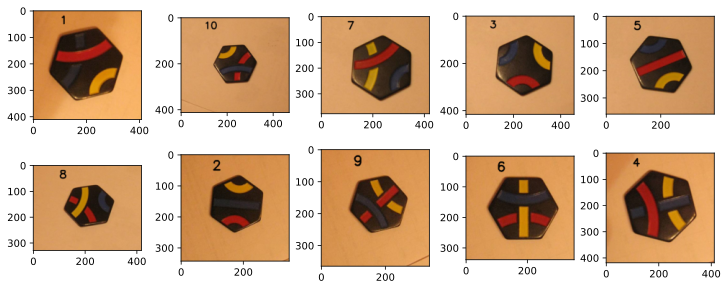

In [225]:
print_images_draw_labels(test_images, types, 2, 5)

### Проверка работы (файл типа Single_*.bmp)

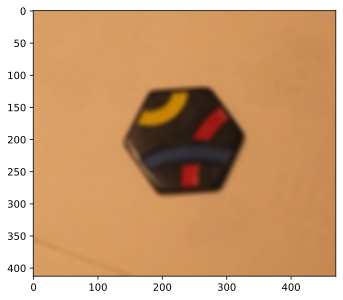

In [226]:
# загрузка файла для тестирования
file_name = 'Single_1.bmp'

testing_image = cv2.imread(file_name)

testing_image = cv2.cvtColor(testing_image, cv2.COLOR_BGR2RGB)
test_image = cv2.GaussianBlur(testing_image, (11, 11), 5)
plt.imshow(test_image)
plt.show()

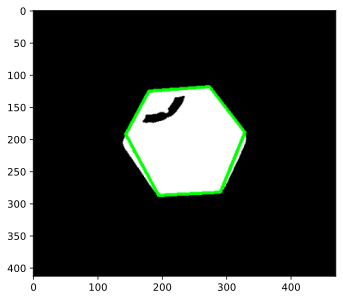

In [227]:
coordinates = approx_figures(test_image, file_name)

In [228]:
coord_middle = edge_middle(coordinates)

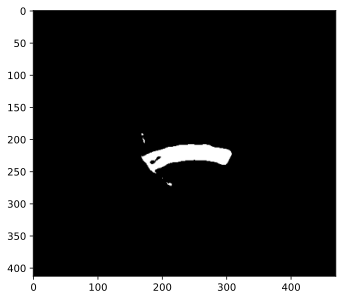

In [229]:
color_squares = np.zeros((1, 3))

# blue
blue_image = test_image.copy()

lower_blue = np.array([0, 0, 31], dtype=np.uint8)
upper_blue = np.array([60, 255, 255], dtype=np.uint8)

blue_image = cv2.inRange(blue_image, lower_blue, upper_blue)
plt.imshow(blue_image, cmap='gray')
plt.show()

color_squares[:, 0] = area_count(1, [blue_image])[0]
color_detection = detect_colors([blue_image], coord_middle, coordinates)

In [230]:
image_detection = []
image_detection.append(np.zeros(3))
        
nonzero_ind = np.nonzero(color_detection[0])[0]
l = abs(nonzero_ind[0] - nonzero_ind[1])
if l > 3:
    l = 6 - l
image_detection[0][0] = l

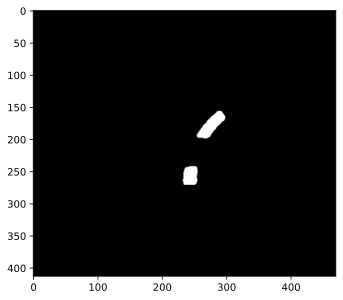

In [231]:
# red
red_image = test_image.copy()

lower_red = np.array([130, 0, 10], dtype=np.uint8)
upper_red = np.array([200, 70, 80], dtype=np.uint8)

red_image = cv2.inRange(red_image, lower_red, upper_red)
plt.imshow(red_image, cmap='gray')
plt.show()

color_squares[:, 1] = area_count(1, [red_image])[0]
color_detection = detect_colors([red_image], coord_middle, coordinates)

In [232]:
nonzero_ind = np.nonzero(color_detection[0])[0]
l = abs(nonzero_ind[0] - nonzero_ind[1])
if l > 3:
    l = 6 - l
image_detection[0][1] = l

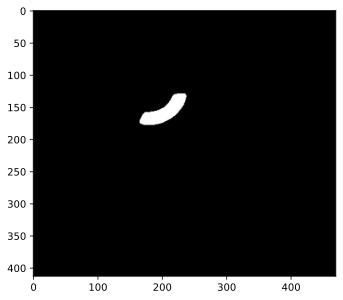

In [233]:
# yellow
yellow_image = test_image.copy()

lower_yellow = np.array([140, 80, 0], dtype=np.uint8)
upper_yellow = np.array([255, 150, 25], dtype=np.uint8)

yellow_image = cv2.inRange(yellow_image, lower_yellow, upper_yellow)
plt.imshow(yellow_image, cmap='gray')
plt.show()

color_squares[:, 2] = area_count(1, [yellow_image])[0]
color_detection = detect_colors([yellow_image], coord_middle, coordinates)

In [234]:
nonzero_ind = np.nonzero(color_detection[0])[0]
l = abs(nonzero_ind[0] - nonzero_ind[1])
if l > 3:
    l = 6 - l
image_detection[0][2] = l

In [235]:
colors = ['синяя', 'красная', 'желтая']
answers = []

answer = ''
for j in range(3):
    if image_detection[0][j] == 1:
        answer += 'короткая '
    elif image_detection[0][j] == 2:
        answer += 'длинная '
    elif image_detection[0][j] == 3:
        answer += 'прямая '
    answer += colors[j]
    answer += '; '

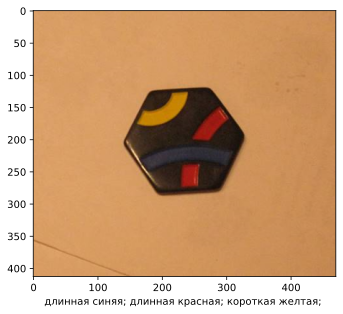

In [236]:
plt.imshow(testing_image)
plt.xlabel(answer)
plt.show()

In [237]:
type_ = ''

curr_type = []
for key, value in types_dict.items():
    if value == answer:
        curr_type.append(key)
if len(curr_type) == 1:
     type_ = curr_type[0]
else:
    type_ = square_comparing(curr_type, 0, color_squares)

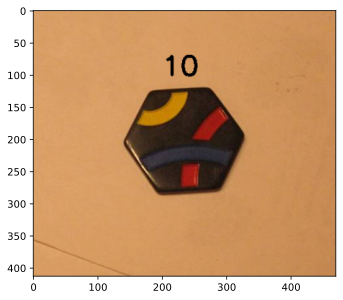

In [238]:
plt.imshow(cv2.putText(testing_image, str(type_), (200,100), cv2.FONT_HERSHEY_SIMPLEX, 1.4, (0, 0, 0), 3))
plt.show()

## Задание 4 (Определить расположение и номера всех фишек в кадре)

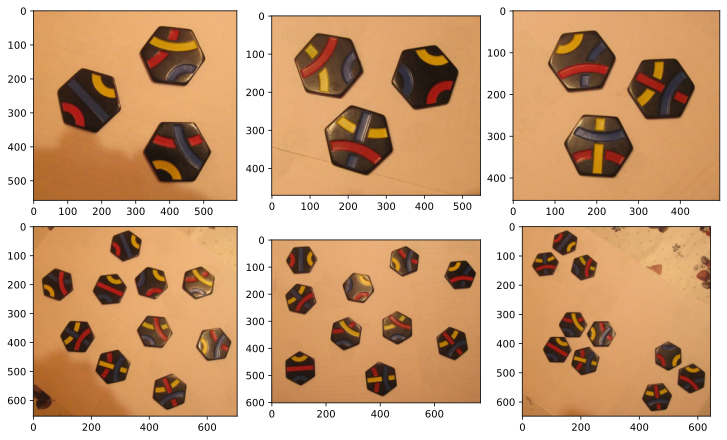

In [239]:
# имена считываемых файлов
image_names = ["Group_1.bmp", "Group_2.bmp", "Group_3.bmp",
               "Group_4.bmp", "Group_5.bmp", "Group_6.bmp"]

# лист уже считанных исходных тестовых файлов
test_images = []

for image in image_names:
    test_images.append(cv2.imread(image))
for i in range(len(test_images)):
    test_images[i] = cv2.cvtColor(test_images[i], cv2.COLOR_BGR2RGB)

print_images_list(test_images, False, 2, 3, figsize=(10,6))

#### Методы

In [240]:
def delete_shadows(img):

    dilated_img = cv2.dilate(img, np.ones((11,11), np.uint8)) 
    bg_img = cv2.medianBlur(dilated_img, 21)
    diff_img = 255 - cv2.absdiff(img, bg_img)
    norm_img = diff_img.copy()
    cv2.normalize(diff_img, norm_img, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)

    return diff_img

In [241]:
# для аппроксимации фишек на одном изображении

def approx_figures_groups(test_image):

    # копия считанного изображения для аппроксимации контуров
    image_contours = test_image.copy()

    # лист изображений с выделенными контурами для вывода/демонстрации
    approxed = []

    # координаты вершин шестиугольников - обход против часовой стрелки
    coordinates = []

    # рисуем шестиугольник + сохраняем координаты вершин для вычисления середин ребер
    image_contours = delete_shadows(image_contours)
    image_contours = cv2.cvtColor(image_contours, cv2.COLOR_BGR2GRAY)
    image_contours = cv2.threshold(image_contours, 105, 255, cv2.THRESH_OTSU)[1]
    image_contours = cv2.bitwise_not(image_contours)

    contours = cv2.findContours(image_contours, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
    k=0
    for cnt in contours:
        if cv2.contourArea(cnt) > 3600:
            epsilon = 0.035 * cv2.arcLength(cnt, True)
            approx = cv2.approxPolyDP(cnt, epsilon, True)

            # сохраняем координаты
            if len(approx) == 6:
                k+=1
                coordinates.append(np.array(approx.squeeze()))
                cv2.drawContours(image_contours, [approx], -1, (200, 200, 200), 3)
    return coordinates

In [242]:
# вырезаем фишку из изображения

def fishka_crop(test_image, coordinates):
    img = test_image.copy()
    pts = coordinates

    # выделяем границу
    rect = cv2.boundingRect(pts)
    x, y, w, h = rect
    croped = img[y : y+h, x : x+w].copy()

    # создаем маску
    pts = pts - pts.min(axis=0)

    mask = np.zeros(croped.shape[:2], np.uint8)
    cv2.drawContours(mask, [pts], -1, (255, 255, 255), -1, cv2.LINE_AA)

    dst = cv2.bitwise_and(croped, croped, mask=mask)

    # добавляем белый фон 
    bg = np.ones_like(croped, np.uint8)*255
    cv2.bitwise_not(bg,bg, mask=mask)
    dst2 = bg+ dst
    
    return dst2

In [243]:
# определение четырех углов квадрата - области вокруг центра ребра, где ищем пиксели нужного цвета
# возвращаем координаты углов, начиная с левого нижнего, по часовой стрелке

def select_pixel_area_gropus(pixel_coord, coord1, coord2):
    ch1 = np.array([(coord1[0]+pixel_coord[0])/2, (coord1[1]+pixel_coord[1])/2])
    ch2 = np.array([(coord2[0]+pixel_coord[0])/2, (coord2[1]+pixel_coord[1])/2])

    return np.fmin(ch1[0], ch2[0]), np.fmax(ch1[0], ch2[0]), np.fmin(ch1[1], ch2[1]), np.fmax(ch1[1], ch2[1])

In [244]:
def area_update(min_x, max_x, min_y, max_y, edge):
    dx, dy = 0.0, 0.0
    if (max_x - min_x) > (max_y - min_y):
        dx = (max_x - min_x)/2
        dy = edge/2
    else:
        dy = (max_y- min_y)/2
        dx = edge/2
    return dx, dy

In [245]:
def total_coord(dx, dy, center):
    min_x = center[0] - dx
    max_x = center[0] + dx
    min_y = center[1] - dy
    max_y = center[1] + dy
    return min_x, max_x, min_y, max_y

In [246]:
def approx_figures_fishk(test_images, nrows=1, ncols=3, show=False):

    # копия листа считанных файлов для аппроксимации контуров
    images_contours = test_images.copy()

    # лист изображений с выделенными контурами для вывода/демонстрации
    approxed = []

    # координаты вершин шестиугольников - обход против часовой стрелки
    coordinates = []

    for i in range(len(images_contours)):
        coordinates.append(np.zeros((len(test_images), 2)))

    # рисуем шестиугольник + сохраняем координаты вершин для вычисления середин ребер
    for i in range(len(images_contours)):
        images_contours[i] = cv2.cvtColor(images_contours[i], cv2.COLOR_BGR2GRAY)
        images_contours[i] = cv2.threshold(images_contours[i], 135, 255, cv2.THRESH_OTSU)[1]
        images_contours[i] = cv2.bitwise_not(images_contours[i])

        contours = cv2.findContours(images_contours[i], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]

        largest_cont = max(contours, key=cv2.contourArea) 
        epsilon = 0.042 * cv2.arcLength(largest_cont, True)
        approx = cv2.approxPolyDP(largest_cont, epsilon, True)

        # рисуем  шестиугольник
        cv2.drawContours(images_contours[i], [approx], -1, (0, 255, 0), 3)

        # отображение изображения
        approxed.append(images_contours[i])

        # сохраняем координаты
        if len(approx.squeeze()) == 6:
            coordinates[i] = np.array(approx.squeeze())
    if show:
        print_images_list(approxed, False, nrows, ncols)
    return coordinates

In [247]:
# вычисляем длину ребра по координатам двум вершин

def edge_length(coord1, coord2):
     return np.linalg.norm(coord1 - coord2)

In [248]:
# определяем грани, с которыми линия текущего цвета имеет пересечения. с помощью круга

def detect_colors_fishk(blue_images, coord_middle, coordinates):
            
    # заведем лист из 6 элементов - под каждое изображение
    # каждый элемент листа - numpy массив из 6 элементов 
    # 6 элементов = 6 ребер, каждый элемент отвечает за наличие цвета на данном ребре

    color_detection = []
    for i in range(len(blue_images)):
        color_detection.append(np.zeros(6))
        
    for i in range(len(blue_images)):
        squares = []
        ima = []
        for j in range(5):
            edge = edge_length(coordinates[i][j], coordinates[i][j+1])

            height,width = blue_images[i].shape
            mask = np.zeros((height,width), np.uint8)
            circle_img = cv2.circle(mask, (int(coord_middle[i][j][0]), int(coord_middle[i][j][1])), int(edge/3), (255,255,255), thickness=-1)
            masked_data = cv2.bitwise_and(blue_images[i], blue_images[i], mask=circle_img)
            _,thresh = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)
            contours = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
            x, y, w, h = cv2.boundingRect(contours[0])
            crop = masked_data[y:y+h,x:x+w]
            ima.append(crop)
            squares.append(cv2.countNonZero(crop))
            
        edge = edge_length(coordinates[i][0], coordinates[i][5])
        height,width = blue_images[i].shape
        mask = np.zeros((height,width), np.uint8)
        circle_img = cv2.circle(mask, (int(coord_middle[i][5][0]), int(coord_middle[i][0][1])), int(edge/3), (255,255,255), thickness=-1)
        masked_data = cv2.bitwise_and(blue_images[i], blue_images[i], mask=circle_img)   
        _,thresh = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY) 
        contours = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
        x, y, w, h = cv2.boundingRect(contours[0])
        crop = masked_data[y:y+h,x:x+w]
        ima.append(crop)
        squares.append(cv2.countNonZero(crop))
        largest_squares = heapq.nlargest(2, squares)
        
        color_detection[i][squares.index(largest_squares[0])] = 1
        color_detection[i][squares.index(largest_squares[1])] = 1
        print_images_list(ima, True, 1, 6)
        
    return color_detection

In [249]:
# находим уравнение перпендикулярной линии к заданной

def find_perpend_line(point1, point2, point_middle):
    if point2[0] == point1[0]:
        return 0
    else:
        k = (point2[1] - point1[1])/(point2[0] - point1[0])
        if k > 0.1 or k < -0.1:
            k_p =  - 1/k
        else:
            k_p = 'error' # перпендикуляр вертикален
        return k_p

In [250]:
# находим координаты вершин двух треугольников - масок

def find_triang_point(point1, point2, bias, point_middle):
    k = find_perpend_line(point1, point2, point_middle)
    if k != 'error':
        alpha = np.arctan(k)
        if k > 0:
            x1 = point_middle[0] - bias * np.cos(alpha)
            y1 = point_middle[1] - k*(point_middle[0] - x1)
        
            x2 = point_middle[0] + bias * np.cos(alpha)
            y2 = point_middle[1] + k*(x2 - point_middle[0])
        else:
            beta = np.pi -  alpha
            x1 = point_middle[0] - bias * np.cos(beta)
            y1 = point_middle[1] + np.tan(beta)*(point_middle[0] - x1)
            
            x2 = point_middle[0] + bias * np.cos(beta)
            y2 = point_middle[1] - np.tan(beta)*(x2 - point_middle[0])
    else:
        x1 = point_middle[0] 
        y1 = point_middle[1] + bias
        
        x2 = point_middle[0]
        y2 = point_middle[1] - bias
    return x1, y1, x2, y2

In [251]:
def choose_2_largest(squares):
    maximum, second_maximum = -1.0, -1.0
    ind, ind2 = -1, -1
    for i in range(len(squares)):
        if squares[i] > maximum:
            second_maximum = maximum
            ind2 = ind
            
            maximum = squares[i]
            ind = i
        elif squares[i] > second_maximum:
            second_maximum = squares[i]
            ind2 = i
    return ind, ind2

In [252]:
# определяем грани, с которыми линия текущего цвета имеет пересечения

def detect_colors_fishk_triangle(blue_images, coord_middle, coordinates, show=False):
            
    # заведем лист из 6 элементов - под каждое изображение
    # каждый элемент листа - numpy массив из 6 элементов 
    # 6 элементов = 6 ребер, каждый элемент отвечает за наличие цвета на данном ребре

    color_detection = []
    for i in range(len(blue_images)):
        color_detection.append(np.zeros(6))
        
    for i in range(len(blue_images)):
        squares = []
        ima = []
        
        edge = mean_edge_length(coordinates[i])
        for j in range(5):
            #edge = edge_length(coordinates[i][j], coordinates[i][j+1])
            height,width = blue_images[i].shape
            mask = np.zeros((height, width), np.uint8)
            
            x1, y1, x2, y2 = find_triang_point(coordinates[i][j], coordinates[i][j+1], int(edge/3), coord_middle[i][j])
            points = np.array([[int(x1), int(y1)], [int(coordinates[i][j][0]), int(coordinates[i][j][1])], [int(x2), int(y2)], [int(coordinates[i][j+1][0]), int(coordinates[i][j+1][1])]])
            triangle_img = cv2.fillPoly(mask, [points], (255,255,255))

            masked_data = cv2.bitwise_and(blue_images[i], blue_images[i], mask=triangle_img)
            _,thresh = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)
            contours = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
            x, y, w, h = cv2.boundingRect(contours[0])
            crop = masked_data[y:y+h,x:x+w]
            
            ima.append(triangle_img)
            squares.append(cv2.countNonZero(crop))

        #edge = edge_length(coordinates[i][0], coordinates[i][5])
        height,width = blue_images[i].shape
        mask = np.zeros((height, width), np.uint8)
        
        x1, y1, x2, y2 = find_triang_point(coordinates[i][5], coordinates[i][0], int(edge/3), coord_middle[i][5])
        points = np.array([[int(x1), int(y1)], [int(coordinates[i][0][0]), int(coordinates[i][0][1])], [int(x2), int(y2)], [int(coordinates[i][5][0]), int(coordinates[i][5][1])]])
        triangle_img = cv2.fillPoly(mask, [points], (255,255,255))

        masked_data = cv2.bitwise_and(blue_images[i], blue_images[i], mask=triangle_img)   
        _,thresh = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY) 
        contours = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
        x, y, w, h = cv2.boundingRect(contours[0])
        crop = masked_data[y:y+h,x:x+w]

        ima.append(triangle_img)
        squares.append(cv2.countNonZero(crop))

        color_detection[i][choose_2_largest(squares)[0]] = 1
        color_detection[i][choose_2_largest(squares)[1]] = 1
        
        if show:
            print_images_list(ima, True, 1, 6)
        
    return color_detection

In [253]:
# определяем грани, с которыми линия текущего цвета имеет пересечения

def detect_colors_fishkkkk(blue_images, coord_middle, coordinates):
            
    # заведем лист из 6 элементов - под каждое изображение
    # каждый элемент листа - numpy массив из 6 элементов 
    # 6 элементов = 6 ребер, каждый элемент отвечает за наличие цвета на данном ребре

    color_detection = []
    for i in range(len(blue_images)):
        color_detection.append(np.zeros(6))
        
    for i in range(len(blue_images)):
        squares = []
        for j in range(5):
            min_x, max_x, min_y, max_y = select_pixel_area_gropus(coord_middle[i][j], coordinates[i][j], coordinates[i][j+1])
            edge = edge_length(coordinates[i][j], coordinates[i][j+1])
            dx, dy = area_update(min_x, max_x, min_y, max_y, edge)
            min_x, max_x, min_y, max_y = total_coord(dx, dy, coord_middle[i][j])
            cropped = blue_images[i][round(min_y):round(max_y), round(min_x):round(max_x)]
            plt.imshow(cropped)
            break
            squares.append(cv2.countNonZero(cropped))
        min_x, max_x, min_y, max_y = select_pixel_area_gropus(coord_middle[i][5], coordinates[i][5], coordinates[i][0])
        edge = edge_length(coordinates[i][0], coordinates[i][5])
        dx, dy = area_update(min_x, max_x, min_y, max_y, edge)
        min_x, max_x, min_y, max_y = total_coord(dx, dy, coord_middle[i][5])
        cropped = blue_images[i][round(min_y):round(max_y), round(min_x):round(max_x)]

        squares.append(cv2.countNonZero(cropped))
        print(squares)
        largest_squares = heapq.nlargest(2, squares)
        print(largest_squares)
        color_detection[i][squares.index(largest_squares[0])] = 1
        color_detection[i][squares.index(largest_squares[1])] = 1
        print('------')
        #break
    return color_detection

In [254]:
# принимает на вход исходное изображение и возврщает список вырезанных фишек

def choose_test_image(test_image):
    
    # координаты на исходном изображении типа Group_*.bmp
    coordinates = approx_figures_groups(test_image)
    
    # создадим список вырезанных фишек для конкретного изображения
    cropped_fishki = []

    for i in range(len(coordinates)):
        cropped_fishki.append(fishka_crop(test_image, coordinates[i]))
        cropped_fishki[i] = cv2.GaussianBlur(cropped_fishki[i], (3, 3), 0)
        
    return coordinates, cropped_fishki

#### Работа с цветами

In [255]:
def color_square(color_images):
    s = np.zeros((len(color_images)))
    for i in range(len(color_images)):
        s[i] = np.sum(color_images[i] == 255)
    
    return s

In [256]:
def blue_color_work(cropped_fishki, nrows, ncols, size=(6, 3), show=False):
    for i in range(len(cropped_fishki)):
        cropped_fishki[i] = cv2.cvtColor(cropped_fishki[i], cv2.COLOR_BGR2HSV)
        
    blue_images = cropped_fishki.copy()
    lower_blue = np.array([0, 0, 40], dtype=np.uint8)
    upper_blue = np.array([180, 80, 200], dtype=np.uint8)

    for i in range(len(cropped_fishki)):
        blue_images[i] = cv2.inRange(blue_images[i], lower_blue, upper_blue)
        blue_images[i] = cv2.morphologyEx(blue_images[i], cv2.MORPH_OPEN, (2, 2))
        #blue_images[i] = cv2.morphologyEx(blue_images[i], cv2.MORPH_ERODE, (2, 2))
        #blue_images[i] = cv2.morphologyEx(blue_images[i], cv2.MORPH_DILATE, (2, 2))

    print('Выделен синий цвет')
    print_images_list(blue_images, True, nrows, ncols, size)
    
    color_squares[:, 0] = color_square(blue_images)
    
    if show:
        print('Строим треугольные маски')
    color_detection = detect_colors_fishk_triangle(blue_images, new_coord_middle, new_coordinates, show)
    
    if show:
        print('Результат детекции цветов')
        print(color_detection)
    
    # для каждого изображения массив из 3 элементов (синий - красный - желтый)
    # 1 - короткая, 2 - длинная, 3 - прямая
    image_detection = []

    for i in range(len(color_detection)):
        image_detection.append(np.zeros(3))
    
    for i in range(len(color_detection)):
        nonzero_ind = np.nonzero(color_detection[i])[0]
        l = abs(nonzero_ind[0] - nonzero_ind[1])
        if l > 3:
            l = 6 - l
        image_detection[i][0] = l
        
    for i in range(len(cropped_fishki)):
        cropped_fishki[i] = cv2.cvtColor(cropped_fishki[i], cv2.COLOR_HSV2BGR)

    return image_detection

In [257]:
def red_color_work(cropped_fishki, image_detection, nrows, ncols, size=(6, 3), show=False):
    red_images = cropped_fishki.copy()

    lower_red = np.array([130, 0, 10], dtype=np.uint8)
    upper_red = np.array([200, 80, 80], dtype=np.uint8)

    for i in range(len(cropped_fishki)):
        red_images[i] = cv2.inRange(red_images[i], lower_red, upper_red)

    print('Выделен красный цвет')
    print_images_list(red_images, True, nrows, ncols, size)
    
    color_squares[:, 1] = color_square(red_images)
    
    if show:
        print('Строим треугольные маски')
    color_detection = detect_colors_fishk_triangle(red_images, new_coord_middle, new_coordinates, show)
    if show:
        print('Результат детекции цветов')
        print(color_detection)
    
    # для каждого изображения массив из 3 элементов (синий - красный - желтый)
    # 1 - короткая, 2 - длинная, 3 - прямая

    for i in range(len(color_detection)):
        nonzero_ind = np.nonzero(color_detection[i])[0]
        l = abs(nonzero_ind[0] - nonzero_ind[1])
        if l > 3:
            l = 6 - l
        image_detection[i][1] = l
        
    return image_detection

In [258]:
def yellow_color_work(cropped_fishki, image_detection, nrows, ncols, size=(6, 3), show=False):
    
    yellow_images = cropped_fishki.copy()

    lower_yellow= np.array([0, 75, 0], dtype=np.uint8)
    upper_yellow = np.array([255, 255, 45], dtype=np.uint8)

    for i in range(len(cropped_fishki)):
        yellow_images[i] = cv2.inRange(yellow_images[i], lower_yellow, upper_yellow)

    print('Выделен желтый цвет')
    print_images_list(yellow_images, True, nrows, ncols, size)
    
    color_squares[:, 2] = color_square(yellow_images)
    
    if show:
        print('Строим треугольные маски')
    color_detection = detect_colors_fishk_triangle(yellow_images, new_coord_middle, new_coordinates, show)
    if show:
        print('Результат детекции цветов')
        print(color_detection)
    
    # для каждого изображения массив из 3 элементов (синий - красный - желтый)
    # 1 - короткая, 2 - длинная, 3 - прямая

    for i in range(len(color_detection)):
        nonzero_ind = np.nonzero(color_detection[i])[0]
        l = abs(nonzero_ind[0] - nonzero_ind[1])
        if l > 3:
            l = 6 - l
        image_detection[i][2] = l
    return image_detection

#### Итог распознавания

In [259]:
def detection_result(image_detection):
    colors = ['синяя', 'красная', 'желтая']
    answers = []


    for i in range(len(image_detection)):
        answer = ''
        for j in range(3):
            if image_detection[i][j] == 1:
                answer += 'короткая '
            elif image_detection[i][j] == 2:
                answer += 'длинная '
            elif image_detection[i][j] == 3:
                answer += 'прямая '
            answer += colors[j]
            answer += '; '
        answers.append(answer)
        
    return answers

In [260]:
def print_image_anwers(images, gray, nrows, ncols, figsize=(10, 30)):
    f, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize,  tight_layout=True)
    if nrows > 1:
        for i in range(nrows):
            for j in range(ncols):
                if (i*ncols + j) < len(images):
                    if gray:
                        ax[i, j].imshow(images[i*ncols + j], cmap='gray')
                    else:
                        ax[i, j].imshow(images[i*ncols + j])
                    ax[i, j].set_xlabel(answers[i*ncols + j])
                else:
                    break
    else:
        for j in range(ncols):
            if (j) < len(images):
                if gray:
                    ax[j].imshow(images[ij], cmap='gray')
                else:
                    ax[j].imshow(images[j])
                ax[j].set_xlabel(answers[j])
            else:
                break
        
    plt.show()

#### Определение номера фишки

1. фишка - длинная синяя, длинная красная, короткая желтая
2. фишка - прямая синяя, короткая красная, короткая желтая
3. фишка - короткая синяя, короткая красная, короткая желтая
4. фишка - прямая синяя, длинная красная, длинная желтая
5. фишка - короткая синяя, прямая красная, короткая желтая
6. фишка - длинная синяя, длинная красная, прямая желтая
7. фишка - короткая синяя, длинная красная, длинная желтая
8. фишка - короткая синяя, длинная красная, длинная желтая
9. фишка - длинная синяя, прямая красная, длинная желтая
10. фишка - длинная синяя, длинная красная, короткая желтая

In [261]:
def fiska_type_result(answers, types_dict, color_squares):
    types = []

    i=0
    for answer in answers:
        curr_type = []
        for key, value in types_dict.items():
            if value == answer:
                curr_type.append(key)
        if len(curr_type) == 1:
            types.append(curr_type[0])
        else:
            types.append(square_comparing(curr_type, i, color_squares))
        i += 1
        
    return types

In [262]:
def print_images_draw_labels_cropped(images, types, nrows, ncols):
    f, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 4), constrained_layout=True)
    if nrows > 1:
        for i in range(nrows):
            for j in range(ncols):
                ax[i, j].imshow(cv2.putText(images[i*ncols + j], str(types[i*ncols + j]), (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (120, 255, 255), 2))
    else:
        for j in range(ncols):
            ax[j].imshow(cv2.putText(images[j], str(types[j]), (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (120, 255, 255), 2))
            
    plt.show()

In [263]:
def print_test_images_draw_labels(image, coords, types):
    image_print = image.copy()
    for i in range(len(types)):
        cv2.putText(image_print, str(types[i]), (int(coords[i][1][0]), int(coords[i][1][1])), cv2.FONT_HERSHEY_SIMPLEX, 1, (120, 255, 255), 2)
    plt.imshow(image_print)        
    plt.show()

### Демонстрация работы для всех групп изображений

#### Group_1

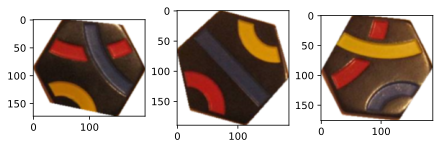

In [264]:
# список вырезанных фишек для конкретного изображения
coordinates, cropped_fishki = choose_test_image(test_images[0])

print_images_list(cropped_fishki, False, 1, 3, (6,3))

##### Работа алгоритма

In [265]:
coord_middle = edge_middle(coordinates)

color_squares = np.zeros((len(cropped_fishki), 3))

# новые координаты углов и середин - для вырезанных изображений
new_coordinates = approx_figures_fishk(cropped_fishki, 1, 3)
new_coord_middle = edge_middle(new_coordinates)

Выделен синий цвет


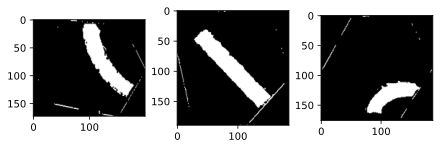

Строим треугольные маски


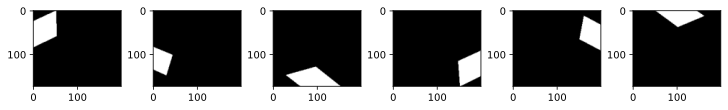

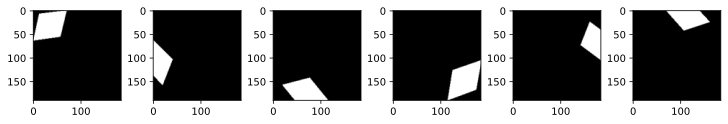

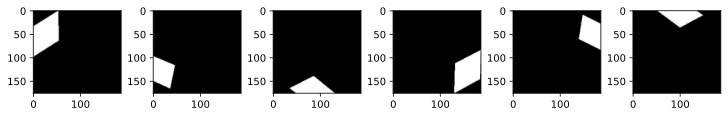

Результат детекции цветов
[array([0., 0., 0., 1., 0., 1.]), array([1., 0., 0., 1., 0., 0.]), array([0., 0., 1., 1., 0., 0.])]


In [266]:
# последний параметр show в методах blue_color_work, red_color_work, yellow_color_work отвечает за демонстрацию принципа работы треугольных масок для детекции цветов
# значение True включает вывод указанных масок (по умолчанию False)

image_detection = blue_color_work(cropped_fishki, 1, 3, (6, 3), True)

Выделен красный цвет


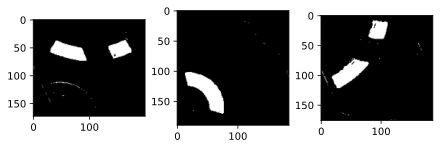

In [267]:
image_detection = red_color_work(cropped_fishki, image_detection, 1, 3, (6, 3))

Выделен желтый цвет


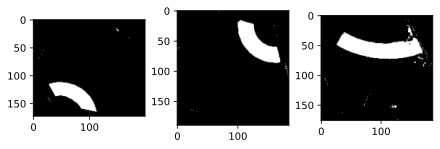

In [268]:
image_detection = yellow_color_work(cropped_fishki, image_detection, 1, 3, (6, 3))

In [269]:
answers = detection_result(image_detection)
answers

['длинная синяя; длинная красная; короткая желтая; ',
 'прямая синяя; короткая красная; короткая желтая; ',
 'короткая синяя; длинная красная; длинная желтая; ']

##### Ответ

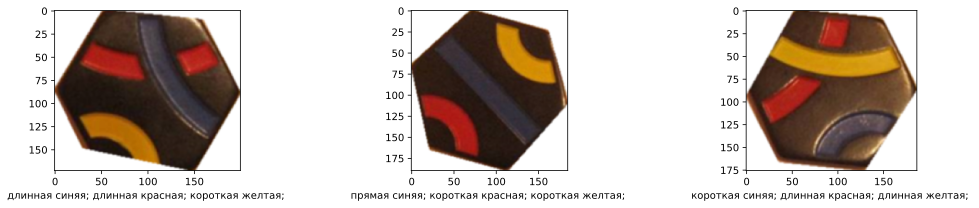

In [270]:
print_image_anwers(cropped_fishki, False, 1, 3, (15, 3))

In [271]:
types = fiska_type_result(answers, types_dict, color_squares)
types

['10', '2', '8']

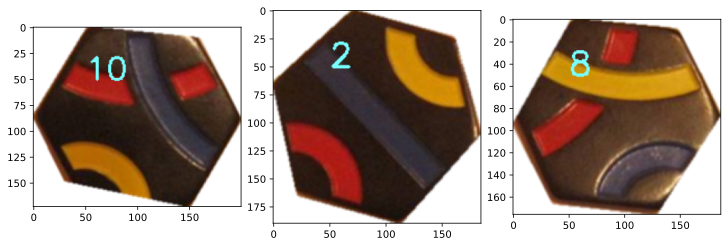

In [272]:
print_images_draw_labels_cropped(cropped_fishki, types, 1, 3)

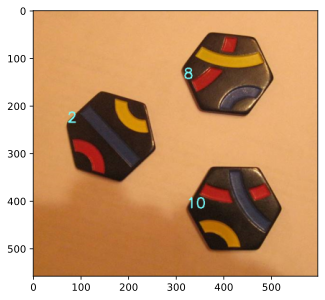

In [273]:
print_test_images_draw_labels(test_images[0], coordinates, types)

#### Group_2

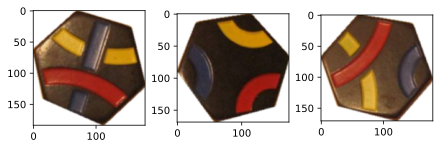

In [274]:
# список вырезанных фишек для конкретного изображения
coordinates, cropped_fishki = choose_test_image(test_images[1])

print_images_list(cropped_fishki, False, 1, 3, (6, 3))

##### Работа алгоритма

In [275]:
coord_middle = edge_middle(coordinates)

color_squares = np.zeros((len(cropped_fishki), 3))

# новые координаты углов и середин - для вырезанных изображений
new_coordinates = approx_figures_fishk(cropped_fishki, 1, 3)
new_coord_middle = edge_middle(new_coordinates)

Выделен синий цвет


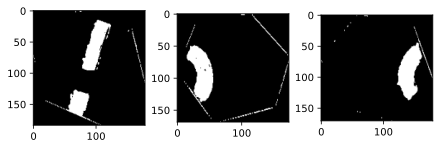

In [276]:
image_detection = blue_color_work(cropped_fishki, 1, 3, (6, 3))

Выделен красный цвет


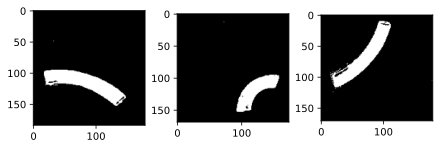

In [277]:
image_detection = red_color_work(cropped_fishki, image_detection, 1, 3, (6, 3))

Выделен желтый цвет


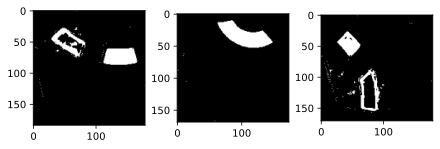

In [278]:
image_detection = yellow_color_work(cropped_fishki, image_detection, 1, 3, (6, 3))

In [279]:
answers = detection_result(image_detection)
answers

['прямая синяя; длинная красная; длинная желтая; ',
 'короткая синяя; короткая красная; короткая желтая; ',
 'короткая синяя; длинная красная; длинная желтая; ']

##### Ответ

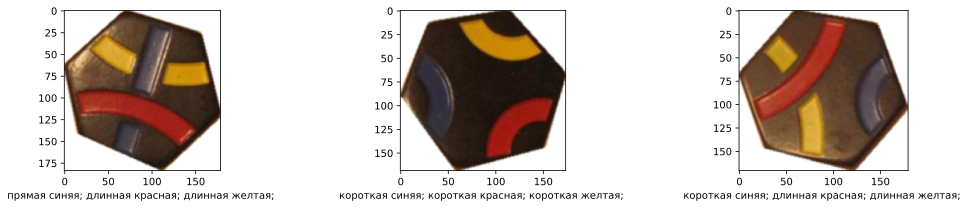

In [280]:
print_image_anwers(cropped_fishki, False, 1, 3, (15, 3))

In [281]:
types = fiska_type_result(answers, types_dict, color_squares)
types

['4', '3', '7']

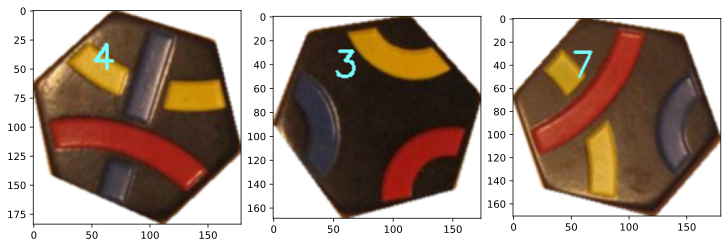

In [282]:
print_images_draw_labels_cropped(cropped_fishki, types, 1, 3)

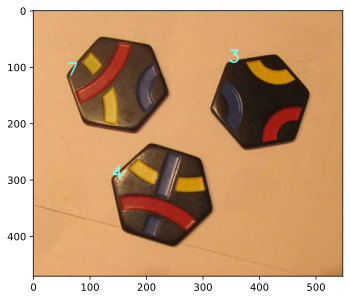

In [283]:
print_test_images_draw_labels(test_images[1], coordinates, types)

#### Group_3

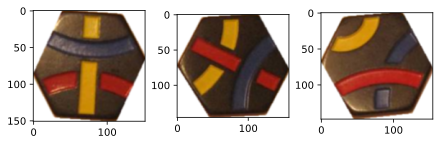

In [284]:
# список вырезанных фишек для конкретного изображения
coordinates, cropped_fishki = choose_test_image(test_images[2])

print_images_list(cropped_fishki, False, 1, 3, (6,3))

##### Работа алгоритма

In [285]:
coord_middle = edge_middle(coordinates)

color_squares = np.zeros((len(cropped_fishki), 3))

# новые координаты углов и середин - для вырезанных изображений
new_coordinates = approx_figures_fishk(cropped_fishki, 1, 3)
new_coord_middle = edge_middle(new_coordinates)

Выделен синий цвет


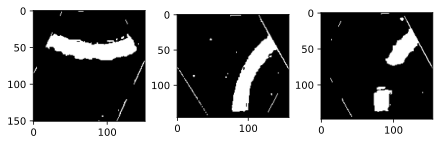

In [286]:
image_detection = blue_color_work(cropped_fishki, 1, 3, (6, 3))

Выделен красный цвет


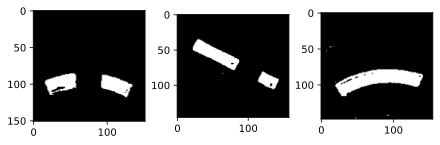

In [287]:
image_detection = red_color_work(cropped_fishki, image_detection, 1, 3, (6, 3))

Выделен желтый цвет


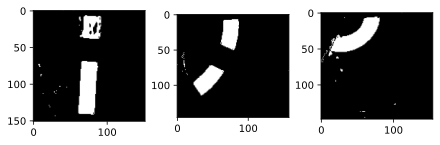

In [288]:
image_detection = yellow_color_work(cropped_fishki, image_detection, 1, 3, (6, 3))

In [289]:
answers = detection_result(image_detection)
answers

['длинная синяя; длинная красная; прямая желтая; ',
 'длинная синяя; прямая красная; длинная желтая; ',
 'длинная синяя; длинная красная; короткая желтая; ']

##### Ответ

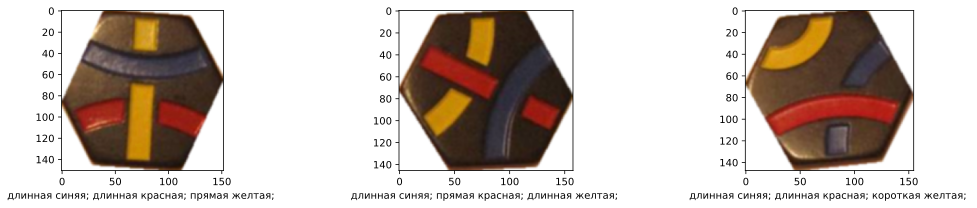

In [290]:
print_image_anwers(cropped_fishki, False, 1, 3, (15, 3))

In [291]:
types = fiska_type_result(answers, types_dict, color_squares)
types

['6', '9', '1']

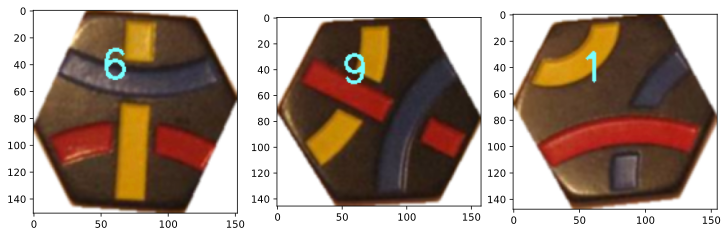

In [292]:
print_images_draw_labels_cropped(cropped_fishki, types, 1, 3)

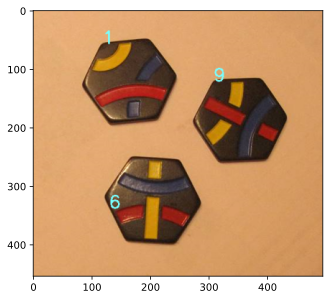

In [293]:
print_test_images_draw_labels(test_images[2], coordinates, types)

#### Group_4

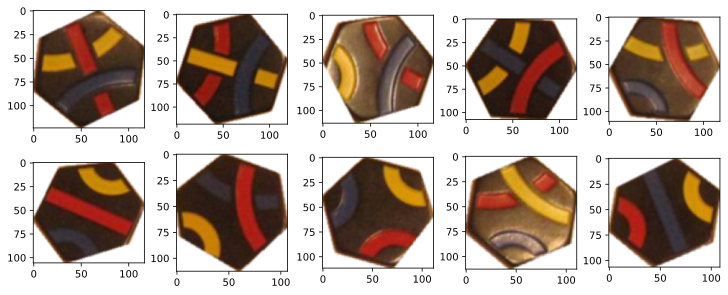

In [294]:
# список вырезанных фишек для конкретного изображения
coordinates, cropped_fishki = choose_test_image(test_images[3])

print_images_list(cropped_fishki, False, 2, 5, (10,4))

##### Работа алгоритма

In [295]:
coord_middle = edge_middle(coordinates)

color_squares = np.zeros((len(cropped_fishki), 3))

# новые координаты углов и середин - для вырезанных изображений
new_coordinates = approx_figures_fishk(cropped_fishki, 2, 5)
new_coord_middle = edge_middle(new_coordinates)

Выделен синий цвет


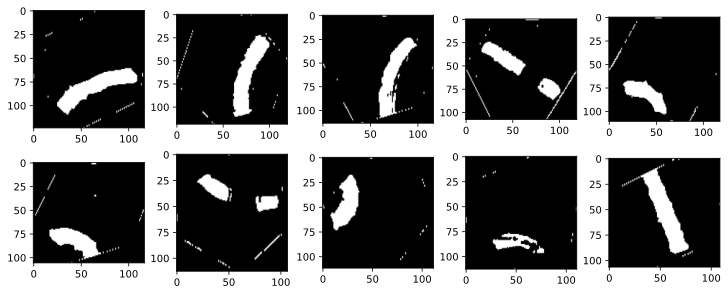

In [296]:
image_detection = blue_color_work(cropped_fishki, 2, 5, (10, 4))

Выделен красный цвет


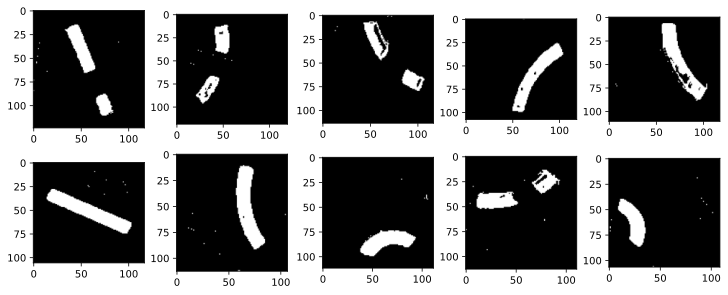

In [297]:
image_detection = red_color_work(cropped_fishki, image_detection, 2, 5, (10, 4))

Выделен желтый цвет


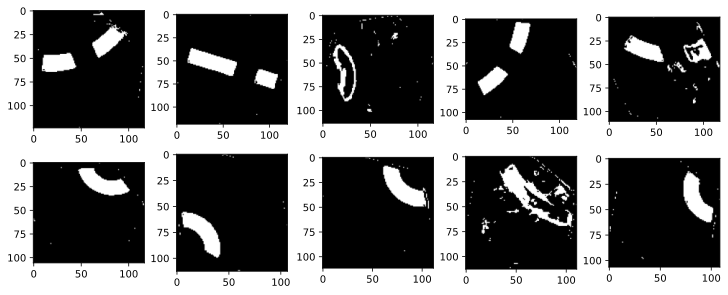

In [298]:
image_detection = yellow_color_work(cropped_fishki, image_detection, 2, 5, (10, 4))

In [299]:
answers = detection_result(image_detection)
answers

['длинная синяя; прямая красная; длинная желтая; ',
 'длинная синяя; длинная красная; прямая желтая; ',
 'длинная синяя; длинная красная; короткая желтая; ',
 'прямая синяя; длинная красная; длинная желтая; ',
 'короткая синяя; длинная красная; длинная желтая; ',
 'короткая синяя; прямая красная; короткая желтая; ',
 'длинная синяя; длинная красная; короткая желтая; ',
 'короткая синяя; короткая красная; короткая желтая; ',
 'короткая синяя; длинная красная; длинная желтая; ',
 'прямая синяя; короткая красная; короткая желтая; ']

##### Ответ

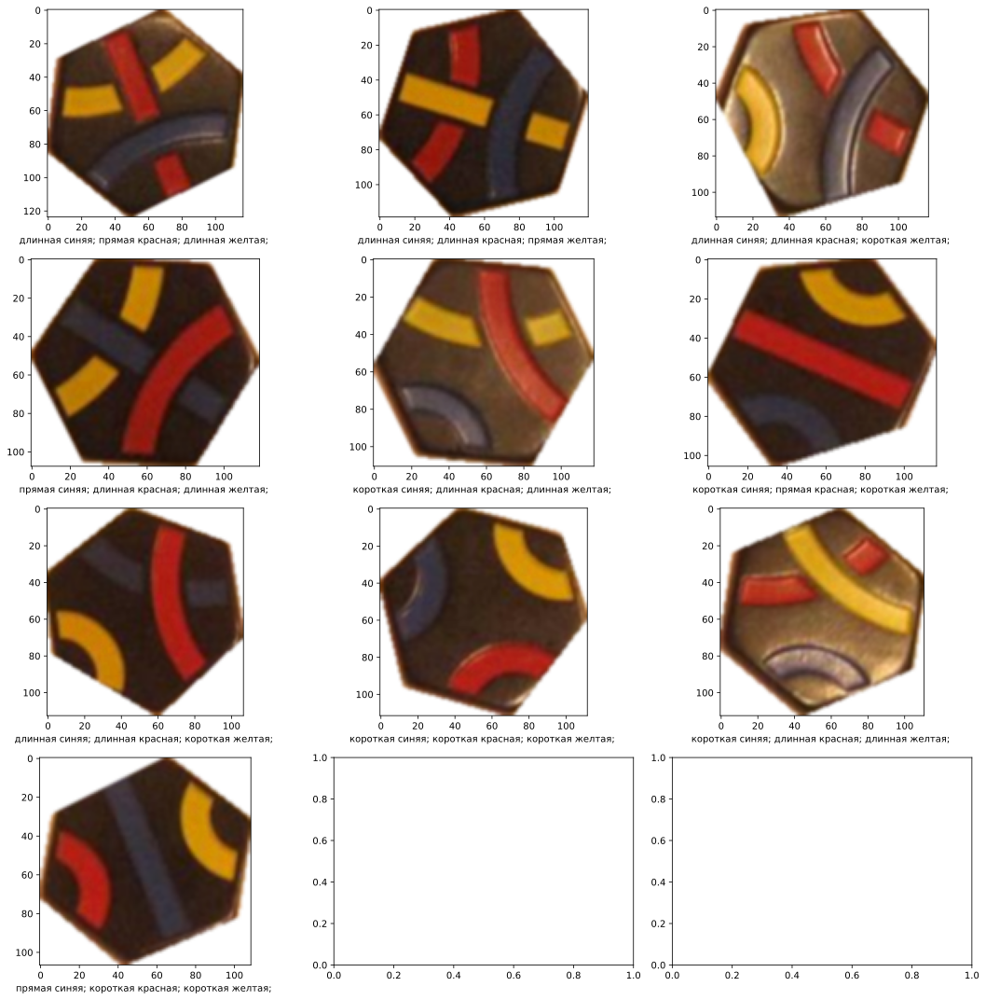

In [300]:
print_image_anwers(cropped_fishki, False, 4, 3, (15, 15))

In [301]:
types = fiska_type_result(answers, types_dict, color_squares)
types

['9', '6', '10', '4', '7', '5', '1', '3', '8', '2']

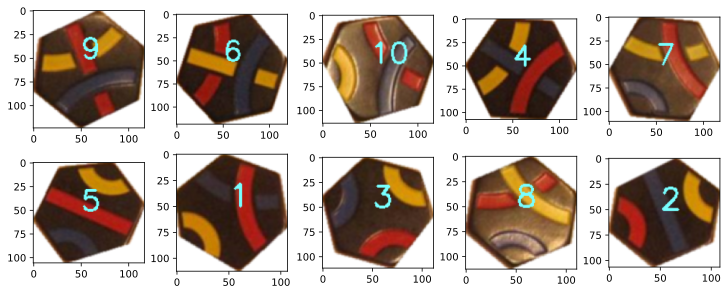

In [302]:
print_images_draw_labels_cropped(cropped_fishki, types, 2, 5)

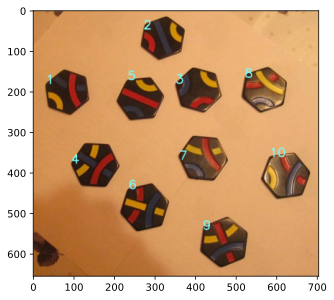

In [303]:
print_test_images_draw_labels(test_images[3], coordinates, types)

#### Group_5

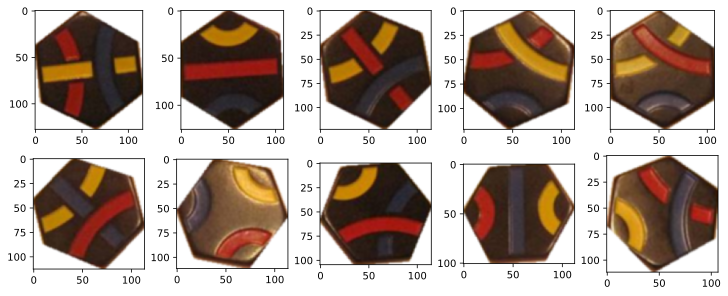

In [304]:
# список вырезанных фишек для конкретного изображения
coordinates, cropped_fishki = choose_test_image(test_images[4])

print_images_list(cropped_fishki, False, 2, 5, (10, 4))

##### Работа алгоритма

In [305]:
coord_middle = edge_middle(coordinates)

color_squares = np.zeros((len(cropped_fishki), 3))

# новые координаты углов и середин - для вырезанных изображений
new_coordinates = approx_figures_fishk(cropped_fishki, 2, 5)
new_coord_middle = edge_middle(new_coordinates)

Выделен синий цвет


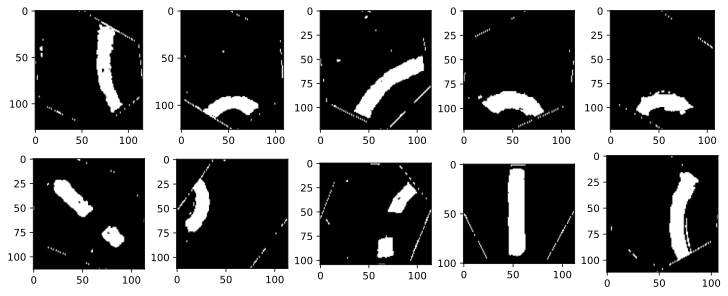

In [306]:
image_detection = blue_color_work(cropped_fishki, 2, 5, (10, 4))

Выделен красный цвет


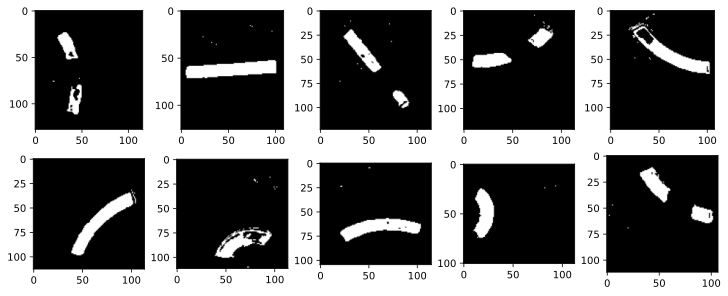

In [307]:
image_detection = red_color_work(cropped_fishki, image_detection, 2, 5, (10, 4))

Выделен желтый цвет


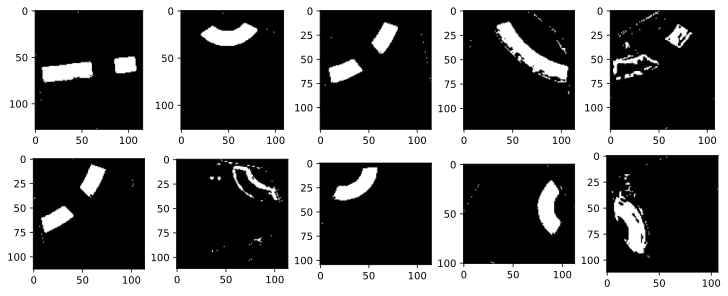

In [308]:
image_detection = yellow_color_work(cropped_fishki, image_detection, 2, 5, (10, 4))

In [309]:
answers = detection_result(image_detection)
answers

['длинная синяя; длинная красная; прямая желтая; ',
 'короткая синяя; прямая красная; короткая желтая; ',
 'длинная синяя; прямая красная; длинная желтая; ',
 'короткая синяя; длинная красная; длинная желтая; ',
 'короткая синяя; длинная красная; длинная желтая; ',
 'прямая синяя; длинная красная; длинная желтая; ',
 'короткая синяя; короткая красная; короткая желтая; ',
 'длинная синяя; длинная красная; короткая желтая; ',
 'прямая синяя; короткая красная; короткая желтая; ',
 'длинная синяя; длинная красная; короткая желтая; ']

##### Ответ

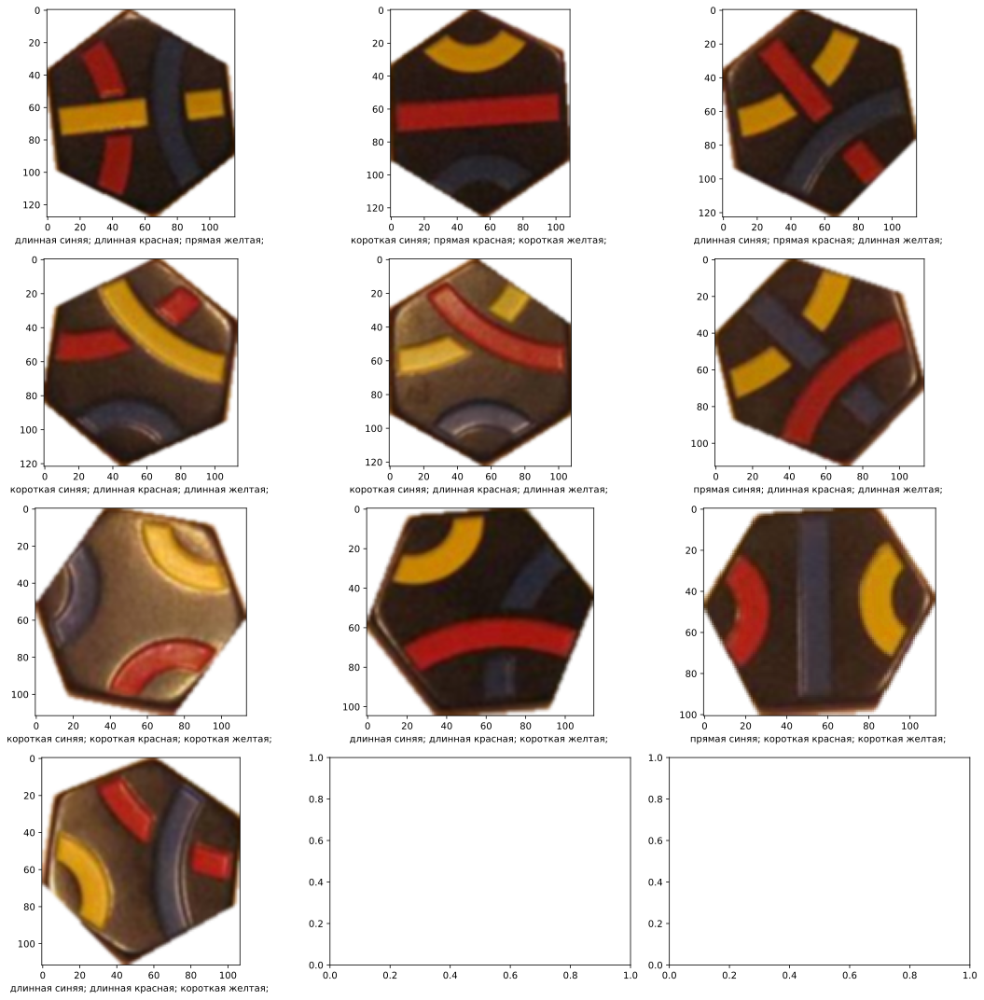

In [310]:
print_image_anwers(cropped_fishki, False, 4, 3, (15, 15))

In [311]:
types = fiska_type_result(answers, types_dict, color_squares)
types

['6', '5', '9', '8', '7', '4', '3', '1', '2', '10']

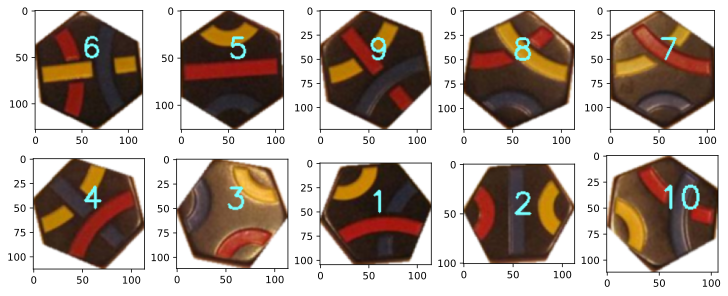

In [312]:
print_images_draw_labels_cropped(cropped_fishki, types, 2, 5)

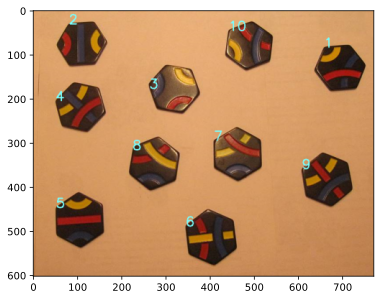

In [313]:
print_test_images_draw_labels(test_images[4], coordinates, types)

#### Group_6

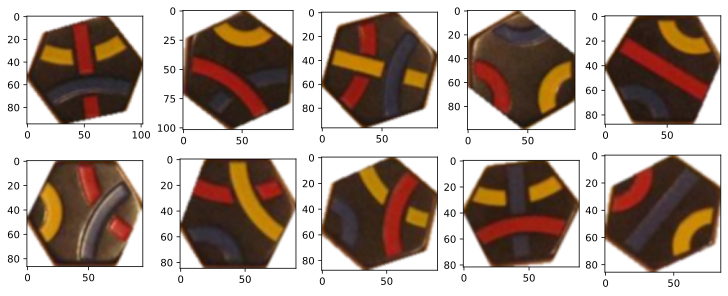

In [314]:
# список вырезанных фишек для конкретного изображения
coordinates, cropped_fishki = choose_test_image(test_images[5])

print_images_list(cropped_fishki, False, 2, 5, (10, 4))

##### Работа алгоритма

In [315]:
coord_middle = edge_middle(coordinates)

color_squares = np.zeros((len(cropped_fishki), 3))

# новые координаты углов и середин - для вырезанных изображений
new_coordinates = approx_figures_fishk(cropped_fishki, 2, 5)
new_coord_middle = edge_middle(new_coordinates)

Выделен синий цвет


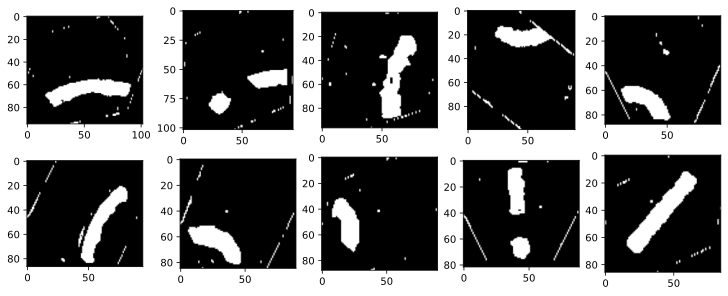

In [316]:
image_detection = blue_color_work(cropped_fishki, 2, 5, (10, 4))

Выделен красный цвет


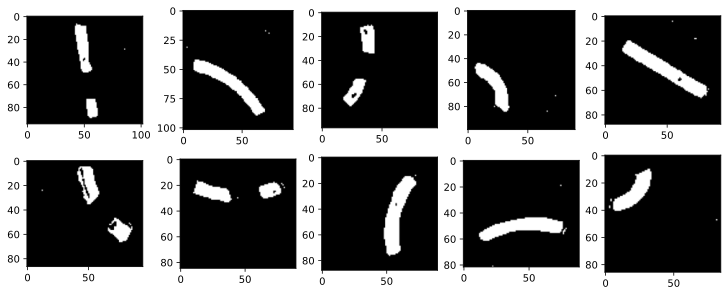

In [317]:
image_detection = red_color_work(cropped_fishki, image_detection, 2, 5, (10, 4))

Выделен желтый цвет


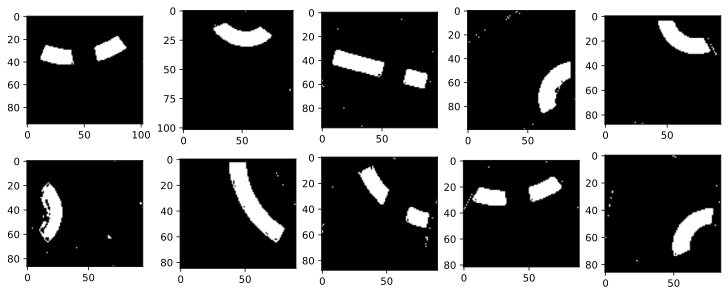

In [318]:
image_detection = yellow_color_work(cropped_fishki, image_detection, 2, 5, (10, 4))

In [319]:
answers = detection_result(image_detection)
answers

['длинная синяя; прямая красная; длинная желтая; ',
 'длинная синяя; длинная красная; короткая желтая; ',
 'длинная синяя; длинная красная; прямая желтая; ',
 'короткая синяя; короткая красная; короткая желтая; ',
 'короткая синяя; прямая красная; короткая желтая; ',
 'длинная синяя; длинная красная; короткая желтая; ',
 'короткая синяя; длинная красная; длинная желтая; ',
 'короткая синяя; длинная красная; длинная желтая; ',
 'прямая синяя; длинная красная; длинная желтая; ',
 'прямая синяя; короткая красная; короткая желтая; ']

##### Ответ

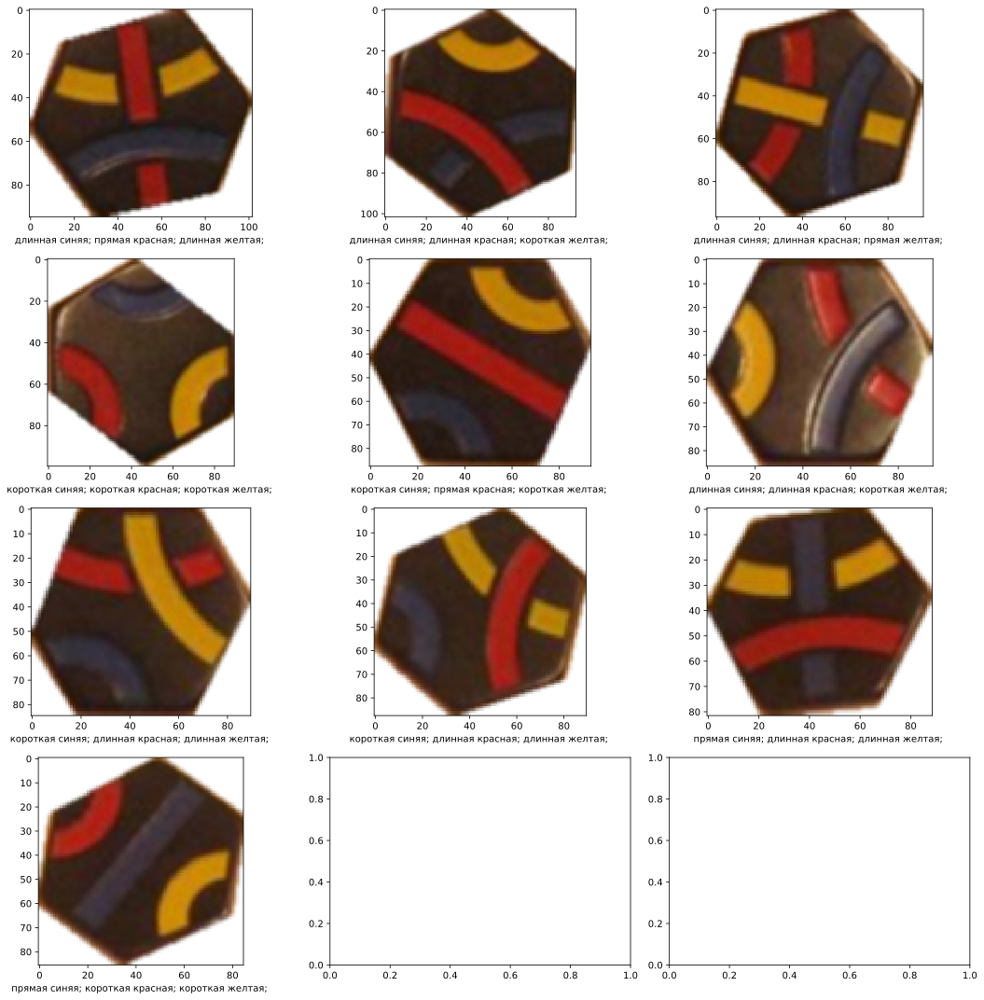

In [320]:
print_image_anwers(cropped_fishki, False, 4, 3, (15, 15))

In [321]:
types = fiska_type_result(answers, types_dict, color_squares)
types

['9', '1', '6', '3', '5', '10', '8', '7', '4', '2']

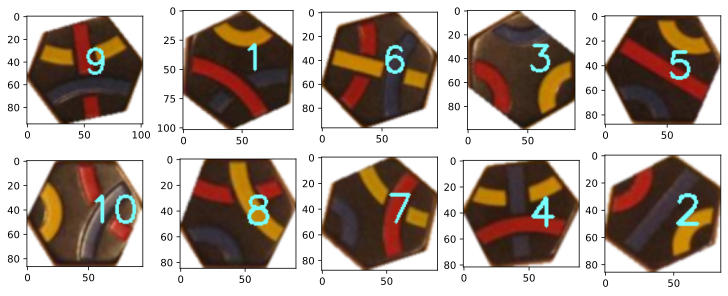

In [322]:
print_images_draw_labels_cropped(cropped_fishki, types, 2, 5)

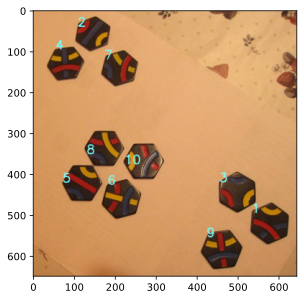

In [323]:
print_test_images_draw_labels(test_images[5], coordinates, types)

### Проверка работы (для любой выбранной группы)

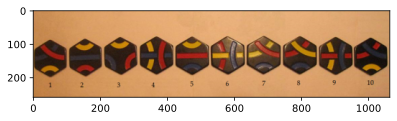

In [324]:
# имя детектируемого изображения
file_name = "Dozen_0.bmp"

test_image = cv2.imread(file_name)
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
plt.imshow(test_image)
plt.show()

In [325]:
coordinates, cropped_fishki = choose_test_image(test_image)
coord_middle = edge_middle(coordinates)
color_squares = np.zeros((len(cropped_fishki), 3))

# ввод желаемого количества строк и столбцов для отображения изображения
n_rows = 2
n_columns = 5

new_coordinates = approx_figures_fishk(cropped_fishki, n_rows, n_columns)
new_coord_middle = edge_middle(new_coordinates)

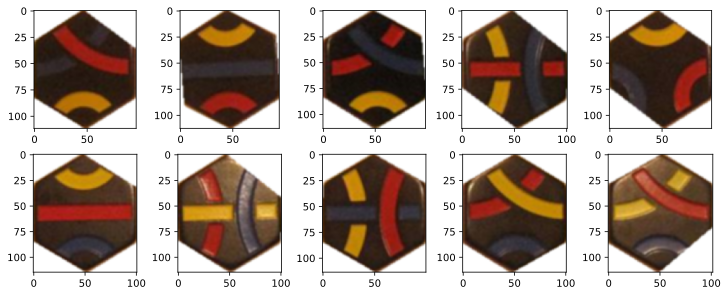

In [326]:
print_images_list(cropped_fishki, False, 2, 5, (10, 4))

Выделен синий цвет


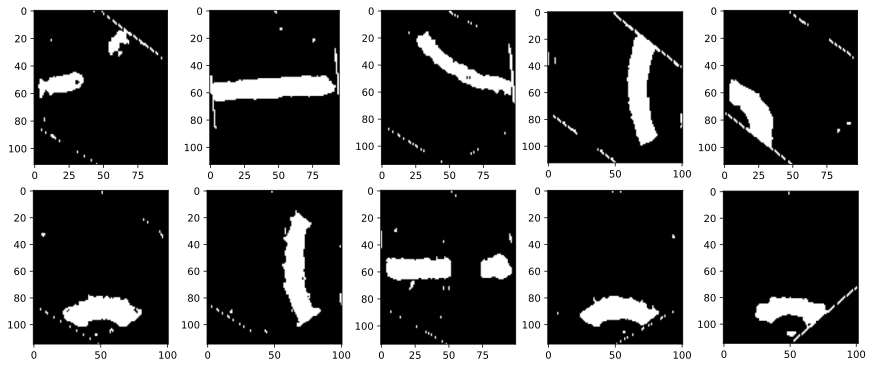

Выделен красный цвет


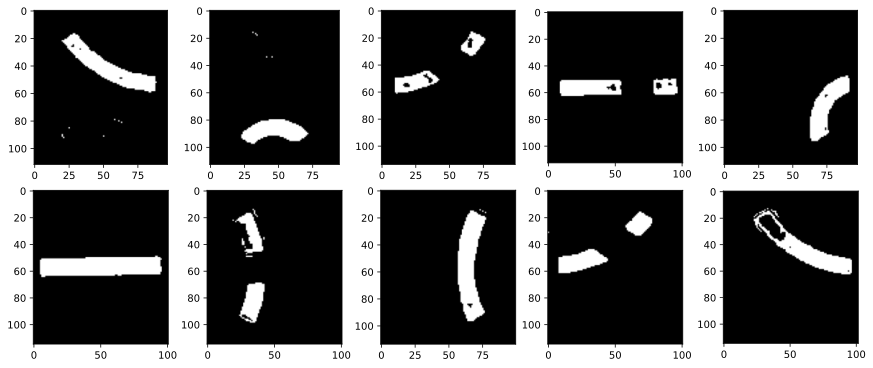

Выделен желтый цвет


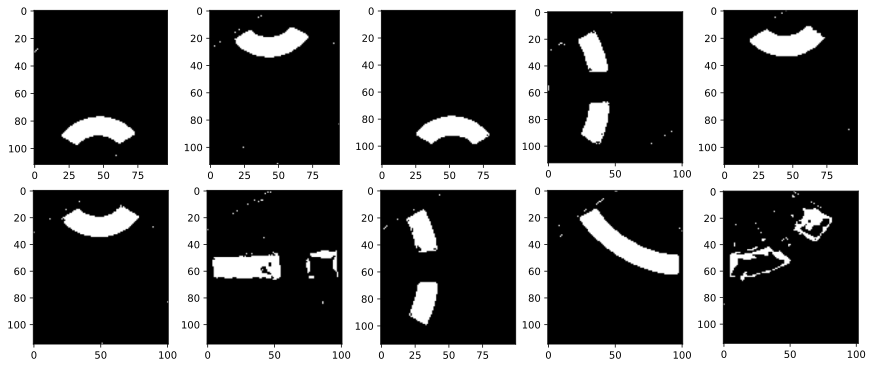

In [327]:
image_detection = blue_color_work(cropped_fishki, n_rows, n_columns, (6*n_rows, n_columns))
image_detection = red_color_work(cropped_fishki, image_detection, n_rows, n_columns, (6*n_rows, n_columns))
image_detection = yellow_color_work(cropped_fishki, image_detection, n_rows, n_columns, (6*n_rows, n_columns))

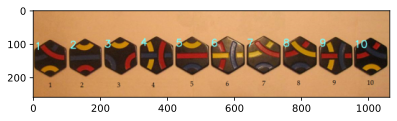

In [328]:
answers = detection_result(image_detection)
types = fiska_type_result(answers, types_dict, color_squares)
print_test_images_draw_labels(test_image, coordinates, types)

In [329]:
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
for i in range(len(types)):
        cv2.putText(test_image, str(types[i]), (int(coordinates[i][1][0]), int(coordinates[i][1][1])), cv2.FONT_HERSHEY_SIMPLEX, 1, (120, 255, 255), 2)

In [330]:
cv2.imwrite('dozen_answers.bmp', test_image)

True

# Beginner

## Задание 1 (Определение количества фишек на изображении типа Group_*.bmp)

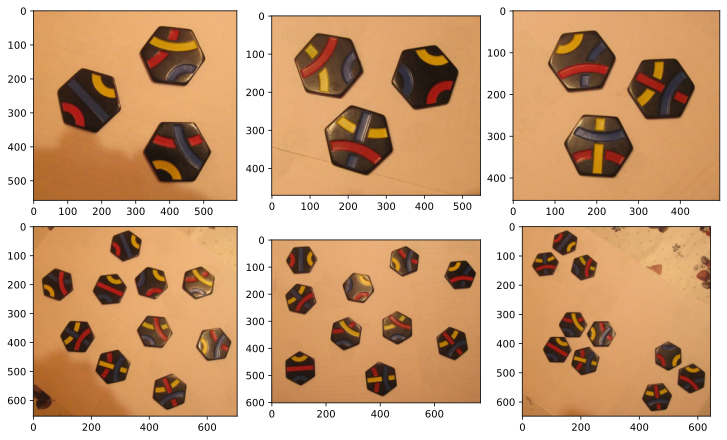

In [331]:
# имена считываемых файлов
image_names = ["Group_1.bmp", "Group_2.bmp", "Group_3.bmp",
               "Group_4.bmp", "Group_5.bmp", "Group_6.bmp"]

# лист уже считанных исходных тестовых файлов
test_images = []

for image in image_names:
    test_images.append(cv2.imread(image))
for i in range(len(test_images)):
    test_images[i] = cv2.cvtColor(test_images[i], cv2.COLOR_BGR2RGB)

print_images_list(test_images, False, 2, 3, figsize=(10,6))

In [332]:
for i in range(len(test_images)):
    coordinates = approx_figures_groups(test_images[i])
    print('На изображении ', image_names[i], ' находится ', len(coordinates), ' фишки(ек)')

На изображении  Group_1.bmp  находится  3  фишки(ек)
На изображении  Group_2.bmp  находится  3  фишки(ек)
На изображении  Group_3.bmp  находится  3  фишки(ек)
На изображении  Group_4.bmp  находится  10  фишки(ек)
На изображении  Group_5.bmp  находится  10  фишки(ек)
На изображении  Group_6.bmp  находится  10  фишки(ек)


## Задание 2 (Определение типа и цвета линий на фишке, изображения типа Single_*.bmp)

1. фишка - длинная синяя, длинная красная, короткая желтая
2. фишка - прямая синяя, короткая красная, короткая желтая
3. фишка - короткая синяя, короткая красная, короткая желтая
4. фишка - прямая синяя, длинная красная, длинная желтая
5. фишка - короткая синяя, прямая красная, короткая желтая
6. фишка - длинная синяя, длинная красная, прямая желтая
7. фишка - короткая синяя, длинная красная, длинная желтая
8. фишка - короткая синяя, длинная красная, длинная желтая
9. фишка - длинная синяя, прямая красная, длинная желтая
10. фишка - длинная синяя, длинная красная, короткая желтая

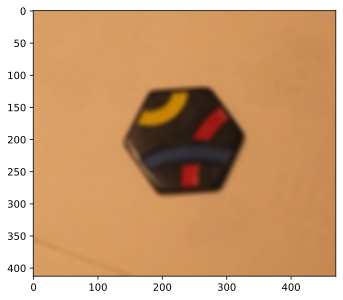

In [333]:
# загрузка файла для тестирования
file_name = 'Single_1.bmp'

testing_image = cv2.imread(file_name)

testing_image = cv2.cvtColor(testing_image, cv2.COLOR_BGR2RGB)
test_image = cv2.GaussianBlur(testing_image, (11, 11), 5)
plt.imshow(test_image)
plt.show()

#### Работа алгоритма

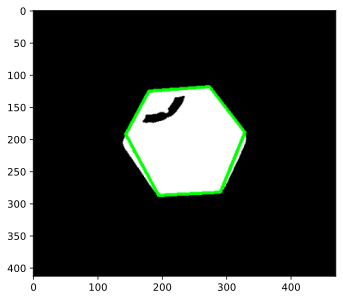

In [334]:
coordinates = approx_figures(test_image, file_name)
coord_middle = edge_middle(coordinates)
color_squares = np.zeros((1, 3))

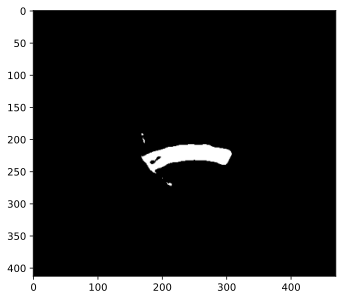

In [335]:
# blue
blue_image = test_image.copy()

lower_blue = np.array([0, 0, 31], dtype=np.uint8)
upper_blue = np.array([60, 255, 255], dtype=np.uint8)

blue_image = cv2.inRange(blue_image, lower_blue, upper_blue)
plt.imshow(blue_image, cmap='gray')
plt.show()

color_squares[:, 0] = area_count(1, [blue_image])[0]
color_detection = detect_colors([blue_image], coord_middle, coordinates)
image_detection = []
image_detection.append(np.zeros(3))
        
nonzero_ind = np.nonzero(color_detection[0])[0]
l = abs(nonzero_ind[0] - nonzero_ind[1])
if l > 3:
    l = 6 - l
image_detection[0][0] = l

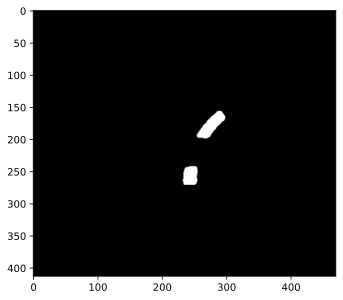

In [336]:
# red
red_image = test_image.copy()

lower_red = np.array([130, 0, 10], dtype=np.uint8)
upper_red = np.array([200, 70, 80], dtype=np.uint8)

red_image = cv2.inRange(red_image, lower_red, upper_red)
plt.imshow(red_image, cmap='gray')
plt.show()

color_squares[:, 1] = area_count(1, [red_image])[0]
color_detection = detect_colors([red_image], coord_middle, coordinates)
nonzero_ind = np.nonzero(color_detection[0])[0]
l = abs(nonzero_ind[0] - nonzero_ind[1])
if l > 3:
    l = 6 - l
image_detection[0][1] = l

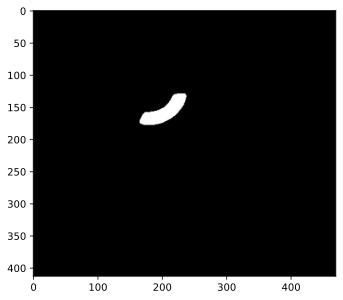

In [337]:
# yellow
yellow_image = test_image.copy()

lower_yellow = np.array([140, 80, 0], dtype=np.uint8)
upper_yellow = np.array([255, 150, 25], dtype=np.uint8)

yellow_image = cv2.inRange(yellow_image, lower_yellow, upper_yellow)
plt.imshow(yellow_image, cmap='gray')
plt.show()

color_squares[:, 2] = area_count(1, [yellow_image])[0]
color_detection = detect_colors([yellow_image], coord_middle, coordinates)
nonzero_ind = np.nonzero(color_detection[0])[0]
l = abs(nonzero_ind[0] - nonzero_ind[1])
if l > 3:
    l = 6 - l
image_detection[0][2] = l

In [338]:
colors = ['синяя', 'красная', 'желтая']
answers = []

answer = ''
for j in range(3):
    if image_detection[0][j] == 1:
        answer += 'короткая '
    elif image_detection[0][j] == 2:
        answer += 'длинная '
    elif image_detection[0][j] == 3:
        answer += 'прямая '
    answer += colors[j]
    answer += '; '

#### Ответ

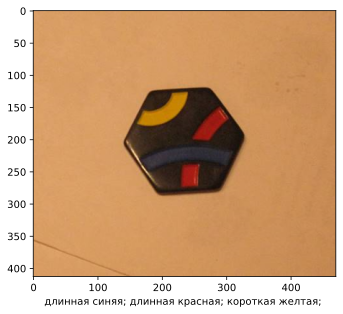

In [339]:
plt.imshow(testing_image)
plt.xlabel(answer)
plt.show()

Полный список описаний Вы можете увидеть в разделе Intermediate - Задание 3 - Итог распознавания